# Computing Services Committee Survey Results Analysis




In [ ]:
!pip install bertopic
!pip install --upgrade joblib==1.1.0
!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 90 kB 724 kB/s 
     |████████████████████████████████| 85 kB 1.7 MB/s 
     |████████████████████████████████| 5.2 MB 38.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 662 kB 40.8 MB/s 
     |████████████████████████████████| 88 kB 8.1 MB/s 
     |████████████████████████████████| 5.8 MB 56.5 MB/s 
     |████████████████████████████████| 1.3 MB 57.2 MB/s 
     |████████████████████████████████| 182 kB 54.1 MB/s 
     |████████████████████████████████| 7.6 MB 57.4 MB/s 
     |████████████████████████████████| 1.1 MB 55.2 MB/s 
  Created wheel for hdbscan: filename=hdbscan-0.8.29-cp38-cp38-linux_x86_64.whl size=2700891 sha256=0c7d4f683315725b5a8eced698d7334f36d7ffc893f1d8e2413caf4f0ec057c4
  Stored in directory: /root/.cache/

In [ ]:
!git clone -b master https://github.com/charles9n/bert-sklearn
!cd bert-sklearn; pip install .

Cloning into 'bert-sklearn'...
remote: Enumerating objects: 259, done.
remote: Total 259 (delta 0), reused 0 (delta 0), pack-reused 259
Receiving objects: 100% (259/259), 516.15 KiB | 1.68 MiB/s, done.
Resolving deltas: 100% (131/131), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/bert-sklearn
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 132 kB 7.9 MB/s 
     |████████████████████████████████| 10.3 MB 39.1 MB/s 
     |████████████████████████████████| 79 kB 6.8 MB/s 
     |████████████████████████████████| 140 kB 52.4 MB/s 


In [ ]:
!pip install --upgrade joblib==1.1.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
pd.set_option('display.max_colwidth', None)

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk import FreqDist
nltk.download('stopwords')

import spacy
# Load the spacy model
nlp = spacy.load('en_core_web_sm')

from bertopic import BERTopic
from sklearn.model_selection import train_test_split
from bert_sklearn import BertClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
from wordcloud import WordCloud,STOPWORDS
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
df = pd.read_csv("CCST Survey_20221109_Text_Answers.csv")
df.head()

,ResonceID,wireless.network.dissatisfaction.factor,wireless.network.dissatisfaction.text,wireless.network.feedback,myslice.satisfied,myslice.dissatisfation.factor,myslice.dissatisfation.text,myslice.feedback,video.conferencing.use,zoom.satisfied,...,accessibility.feedback,accessibility.policy.knowlege,accessibility.doc.creation.impact,accessibility.aware.toolkit,accessibility.professional.development,accessibility.feedback.1,campus.resources.text,it.challenges.text.1,it.challenges.text.2,it.challenges.text.3
0,1,NaN,NaN,none,Agree,NaN,NaN,NaN,Yes,Strongly agree,...,NaN,Somewhat disagree,Somewhat disagree,Disagree,Somewhat agree,NaN,NaN,NaN,NaN,NaN
1,2,"Ease of connection,Speed",NaN,NaN,Disagree,Ease of use,NaN,NaN,Yes,Strongly agree,...,NaN,Disagree,NaN,Disagree,Agree,NaN,NaN,NaN,NaN,NaN
2,3,NaN,NaN,NaN,Agree,NaN,NaN,NaN,Yes,Strongly agree,...,NaN,Somewhat agree,Strongly agree,Strongly disagree,Strongly disagree,NaN,NaN,NaN,NaN,NaN
3,4,NaN,NaN,NaN,Agree,NaN,NaN,NaN,Yes,Agree,...,NaN,Somewhat agree,Somewhat disagree,Agree,Agree,NaN,NaN,NaN,NaN,NaN
4,5,NaN,NaN,NaN,Agree,NaN,NaN,NaN,Yes,Agree,...,NaN,Somewhat disagree,Strongly disagree,Agree,Strongly agree,NaN,NaN,We need an approved project management software package.,NaN,NaN


In [ ]:
df.columns

Index(['ResonceID', 'wireless.network.dissatisfaction.factor',
       'wireless.network.dissatisfaction.text', 'wireless.network.feedback',
       'myslice.satisfied', 'myslice.dissatisfation.factor',
       'myslice.dissatisfation.text', 'myslice.feedback',
       'video.conferencing.use', 'zoom.satisfied',
       'zoom.dissatisfaction.factor', 'zoom.dissatisfaction.text',
       'teams.vid.satisfied', 'teams.vid.dissatisfaction.factor',
       'teams.vid.dissatisfaction.text', 'balance.security.usability',
       'security.min.impact.on.work', 'security.effective.communication',
       'security.know.who.to.talk.to', 'security.yearly.training',
       'security.feedback', 'teach.2021-22', 'teach.platforms',
       'blackboard.satisfied', 'blackboard.dissatisfation.factor',
       'blackboard.dissatisfation.text', 'kaltura.satisfied',
       'kaltura.dissatisfation.factor', 'kaltura.dissatisfation.text',
       'playposit.satisfied', 'playposit.dissatisfation.factor',
       'playposi

# Defining all the necessary functions

# A - Word Cloud

In [ ]:
def word_cloud(df,col):
    df_col = df[~df[col].isnull()][[col]]
    plt.subplots(figsize=(15,15))
    word_cloud = WordCloud(stopwords=STOPWORDS,contour_width=2,
                           collocations = False,
                           background_color = 'white').generate(str(df_col))
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

# B - Frequency Distribution

In [ ]:
def get_freq_distribution(df,col,mostCommon=10):
    cleaned_sentences = list(df[df[col].isnull()==False][col])
    pos_tags = {}
    for i in range(0,len(cleaned_sentences)):
        # Mention when we're halfway there
        if i==int(len(cleaned_sentences)/2):
          pass
            # print("Congratulations! I'm at the halfway mark! Hang in there!\n")

        # Use the spacy model to tag the words in the cleaned sentence
        spsent = nlp(cleaned_sentences[i])
        for token in spsent:
            # I am choosing to track only the VERBS, ADJUECTIVES, NOUNS and PRONOUNS
            # by adding them to a dictionary
            if token.pos_=='NOUN' or token.pos_=='ADJ' or token.pos_=='PROPN' or token.pos_=='VERB':
                try:
                    pos_tags[token.pos_].append(token)
                except:
                    pos_tags[token.pos_]= [token]

    relevant_words = []
    nltk_stops = nltk.corpus.stopwords.words('english')
    for pos in ['NOUN','ADJ','PROPN','VERB']:
        # I shall remove all stopwords, which is probably unnecessary 
        # (Forgive me for doing it it anyway. I'm just trying to be sure.)
        not_stopwords = [w.text for w in pos_tags[pos] if w.text not in nltk_stops]

        # Convert each relevant word to lower case
        relevant_words += [word.lower() for word in not_stopwords]
    # Build a frequency distribution of the relevant noun words
    noun_dist = FreqDist(relevant_words)
    return noun_dist.most_common(mostCommon)

# C - TFIDF Frequency Distribution

In [ ]:
def tfidf_vectorizer(num_of_obs,df,col):
    corpus = df[col].dropna()
    vectorizer = TfidfVectorizer(stop_words='english', ngram_range=[1, 1])
    X = vectorizer.fit_transform(corpus)
    word_list = vectorizer.get_feature_names()
    count_list = X.toarray().sum(axis=0)
    vocab_df = pd.DataFrame(zip(word_list, count_list), 
                            columns=['word', 'tfidf_value'])
    vocab_df = vocab_df.sort_values(by="tfidf_value", ascending=False)
    return vocab_df[0:num_of_obs]

# D - BERT Topic Modelling

In [ ]:
def get_bertTopic_model(reviews,num_topics=5):
    topic_model = BERTopic(embedding_model="all-MiniLM-L12-v2", calculate_probabilities=True, verbose=True)
    topics, probs = topic_model.fit_transform(reviews)
    return topic_model

In [ ]:
def get_bertTopic_freq_dist(topic_model,num_topics=5):
    freq = topic_model.get_topic_info()
    return freq.head(num_topics)

In [ ]:
def get_bertTopic_representatives(topic_model,num_topics=5):
    for i in range(num_topics):
        print("\n== Representative documents in cluster #", i)
        print(topic_model.get_representative_docs(i))

# Analysis for Wireless Network related feedback

In [ ]:
for col in df.columns:
  if 'wireless' in col:
    print(col)

wireless.network.dissatisfaction.factor
wireless.network.dissatisfaction.text
wireless.network.feedback


Word cloud for general feedback received


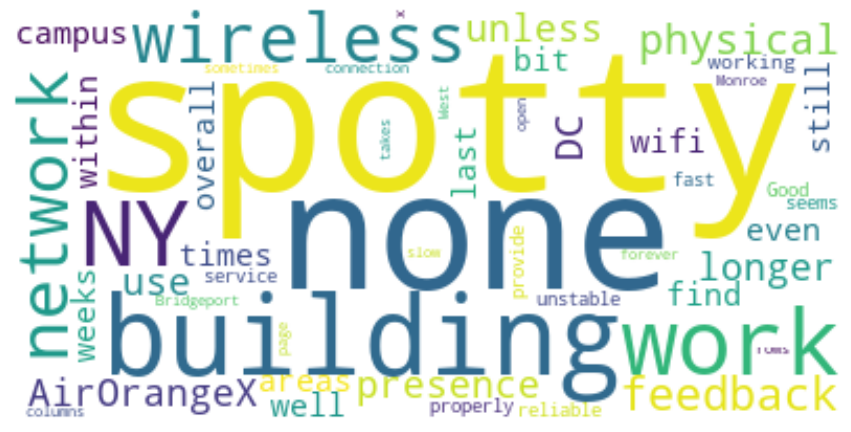



Word cloud to see what is the most common reason for dissatisfaction


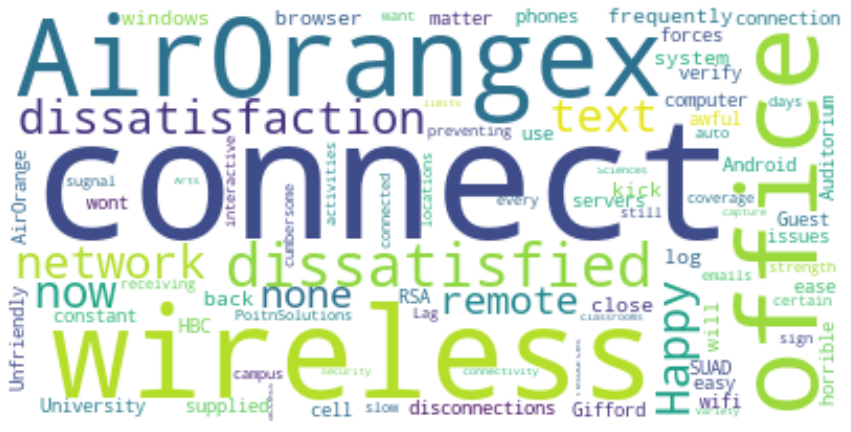

In [ ]:
print('Word cloud for general feedback received')
word_cloud(df, col='wireless.network.feedback')
print("\n")

print("Word cloud to see what is the most common reason for dissatisfaction")
word_cloud(df, col='wireless.network.dissatisfaction.text')

Among the general feedback 'Spotty' is the word that stands out and among the sources of dissatisfaction the 'Connectivity' seems to be a problem. 

In [ ]:
# Percentage of users who are not satisfied with myslice
100*len(df[~df['wireless.network.feedback'].isnull()])/len(df)

35.05513639001741

Since the feedback columns are visible only if users select a disagree category, just by looking at the the overall sentiment we can conclude that 65% of the people seem to be satisfied with the application.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='wireless.network.feedback',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,campus,94
1,network,84
2,wireless,82
3,connect,81
4,use,65
5,work,57
6,times,55
7,issues,54
8,connection,54
9,works,52


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='wireless.network.feedback')).reset_index(drop=True)

,word,tfidf_value
0,campus,20.768695
1,work,19.043127
2,connect,18.895281
3,wireless,17.820292
4,network,17.712366
5,issues,16.793772
6,spotty,16.702658
7,use,16.168025
8,works,16.022451
9,good,14.831919


Analyzing the most common words by checking their frequency and using TF-IDF in the wireless.network.feedback column, the observation supports the inference from the word clouds. Spotty connectivity and newtwork issues are the major features of user feedback.

In [ ]:
# Topic Modelling for all the feedbacks
wireless_network_topic_model = get_bertTopic_model(list(df[df['wireless.network.feedback'].isnull()==False]['wireless.network.feedback']),num_topics=5)
get_bertTopic_freq_dist(wireless_network_topic_model,num_topics=5)

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/573 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/134M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/352 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Batches:   0%|          | 0/19 [00:00<?, ?it/s]

2022-12-13 06:04:26,474 - BERTopic - Transformed documents to Embeddings
2022-12-13 06:04:36,826 - BERTopic - Reduced dimensionality
2022-12-13 06:04:36,885 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,93,-1_the_to_network_is
1,0,141,0_it_reliable_works_good
2,1,90,1_to_it_connect_sometimes
3,2,61,2_wireless_the_is_campus
4,3,45,3_airorangex_to_the_and


In [ ]:
get_bertTopic_representatives(wireless_network_topic_model,num_topics=5)


== Representative documents in cluster # 0
['It seems to work - and work well. What more could we want.', 'I have not encountered any issues.', 'I have had no porblems']

== Representative documents in cluster # 1
['We have to change our password too Frequently', 'Sometimes difficult to get my devices to connect', "My Phone won't connect to it"]

== Representative documents in cluster # 2
['Campus wireless is very reliable', "I wish I had this excellent wireless network when I work from home.  I didn't realize how strong it was until having to navigate Spectrum. ;)", 'I am satisfied with the wireless network on campus.']

== Representative documents in cluster # 3
["I ride the bus to/from the Manley parking lot and College Place every day. AirOrangeX doesn't work on the bus. Even when sitting on the bus at College Place, it often doesn't connect - let alone on the bus ride down Comstock.", 'In our building, I sometimes need to switch between the CampusAD network and AirOrangeX when th

## Cluster Analysis

    Cluster 0 - Login to Wireless Network

Details: Users seem to have issues logging into or connecting to the wireless network

    Cluster 1 - Reliable

Details: A good chunk of feedback is also positive as users find the wireless network reliable

    Cluster 2 - Connectivity Issues in certain regions of the campus

Details: Poor connectivity in some classrooms or in the buses.

    Cluster 3 - Works great

Details: Users are happy

    Cluster 4 -  Connectivity critical for teaching


# Analysis for MySlice related feedback

In [ ]:
for col in df.columns:
  if 'myslice' in col:
    print(col)

myslice.satisfied
myslice.dissatisfation.factor
myslice.dissatisfation.text
myslice.feedback


Word cloud for general feedback received


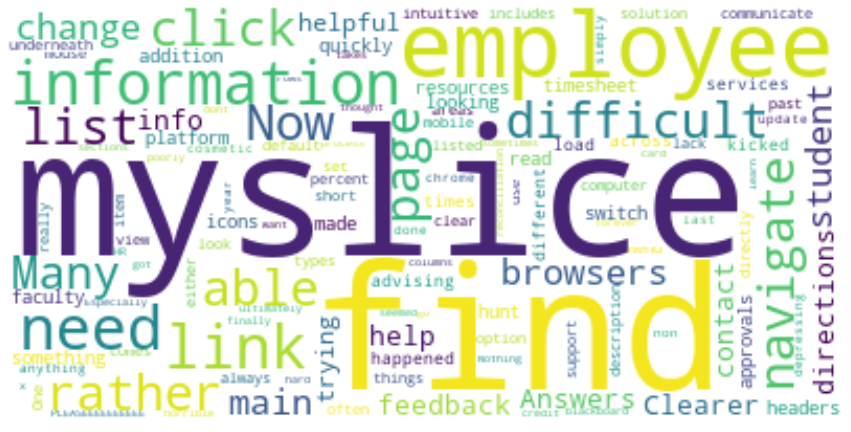



Word cloud to see what is the most common sentiment


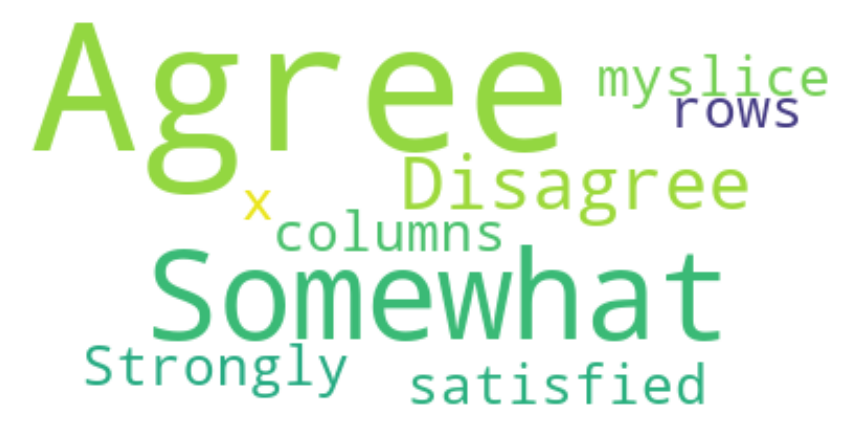



Word cloud to see what is the most common factor for dissatisfaction


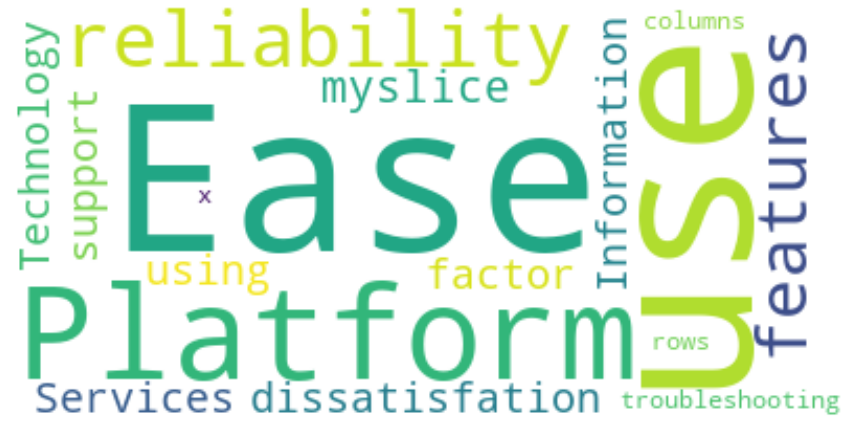



Word cloud to see what is the most common reason for dissatisfaction


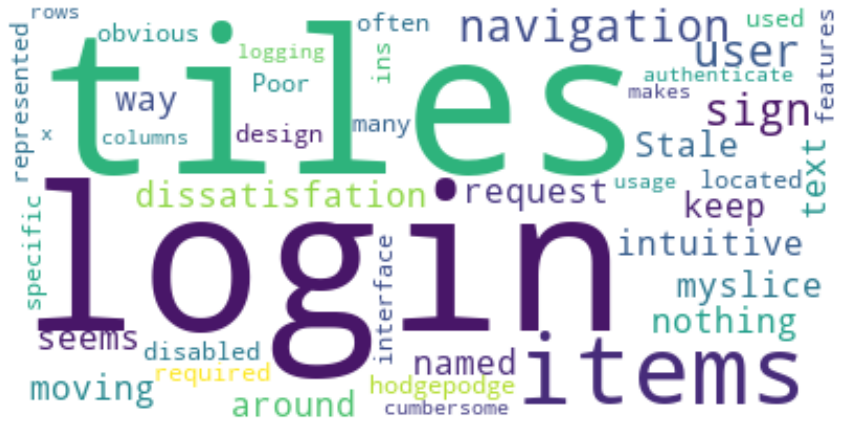

In [ ]:
print('Word cloud for general feedback received')
word_cloud(df, col='myslice.feedback')
print("\n")

print("Word cloud to see what is the most common sentiment")
word_cloud(df, col='myslice.satisfied')
print("\n")

print("Word cloud to see what is the most common factor for dissatisfaction")
word_cloud(df, col='myslice.dissatisfation.factor')
print("\n")

print("Word cloud to see what is the most common reason for dissatisfaction")
word_cloud(df, col='myslice.dissatisfation.text')

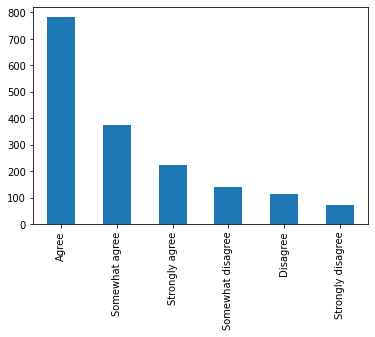

In [ ]:
df['myslice.satisfied'].value_counts().plot(kind='bar')

It seems like myslice is used extensively while giving feedback along with the fact that it is difficult to use and that users have a hard time navigating and logging in (it does keep logging out and give stale user issues quite frequently based on personal usage). Some users also find it unrealiable.

In [ ]:
# Percentage of users who are not satisfied with myslice
100*len(df[~df['myslice.feedback'].isnull()])/len(df)

27.858386535113176

Since the feedback columns are visible only if users select a disagree category, just by looking at the the overall sentiment we can conclude that 73% of the people seem to be satisfied with the application.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='myslice.feedback',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,myslice,252
1,find,136
2,use,89
3,information,63
4,time,62
5,need,60
6,things,53
7,new,49
8,difficult,45
9,student,43


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='myslice.feedback')).reset_index(drop=True)

,word,tfidf_value
0,myslice,26.262093
1,use,13.709804
2,information,11.572519
3,difficult,10.811899
4,things,10.712093
5,need,10.134256
6,intuitive,9.983637
7,like,9.883905
8,hard,9.731072
9,time,9.688833


Analyzing the most common words by checking their frequency and using TF-IDF, in the feedback column myslice was most commonly used and again it seems that the faculty has a hard time using and finding information.

In [ ]:
# Topic Modelling for all the feedbacks
topic_model = get_bertTopic_model(list(df[df['myslice.feedback'].isnull()==False]['myslice.feedback']),num_topics=5)
get_bertTopic_freq_dist(topic_model,num_topics=5)

Batches:   0%|          | 0/15 [00:00<?, ?it/s]

2022-12-12 00:47:54,526 - BERTopic - Transformed documents to Embeddings
2022-12-12 00:47:57,381 - BERTopic - Reduced dimensionality
2022-12-12 00:47:57,415 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,113,-1_to_the_and_it
1,0,107,0_myslice_to_the_is
2,1,94,1_the_it_to_is
3,2,34,2_to_the_student_that
4,3,33,3_to_time_the_approve


In [ ]:
get_bertTopic_representatives(topic_model,num_topics=5)


== Representative documents in cluster # 0
['MySlice, as of its recent changes, has become more confusing and difficult to navigate.', 'Myslice seems very clunky and even though it has been updated, I still am not sure how to navigate to some of the things that I used to do on the old interface.', "I found it easier to navigate when there were textboxes on the homepage that listed the links within different areas. With the current icons for the categories, a user has to guess which topic will have the information one is looking for. Thankfully, I don't need to access MySlice that often, and when I do, it's only to one of three areas."]

== Representative documents in cluster # 1
['Clunky especially the new interface. I waste too much time trying to find what I need.', 'I don’t use it that much, but it seems clunky.', 'The new interface with icons is visually an improvement but it can be hard to remember under which icon a given piece of information is located']

== Representative docu

## Cluster Analysis

    Cluster 0 - Navigation on mySlice

Details: Users seem to have issues finding the menus and users seem to be unhappy about charging their hours using the timeclock on mySlice.

    Cluster 1 - Interface

Details: Some users seem to find the new tile interface confusing and clunky, few do like how it looks but agree that it is not very functional.

    Cluster 2 - Prof's using mySlice

Details: Prof's find it difficult to advice students, the information regarding course dates, semester dates seem to be generally incorrect leading to extra work for Prof's. Also, it seems that the interface for students and faculty is the same and it shows the student interface by default so faculty wants to have the functionalty to personalize their views to avoid unneccesary clicks.

    Cluster 3 - Inefficient

Details: This cluster is also navigation but here we can see that we can save a page as a favorite and save time rather than navigating again and again to a page.

    Cluster 4 - Need better communication 

Details: There seems to be no university wide communication when there are updates on myslice.


**Topic Modelling of Feedback from reviewers who were STRONGLY DISSATISFIED with MySlice**

In [ ]:
len(df[(df['myslice.feedback'].isnull()==False) & (df['myslice.satisfied']=="Strongly disagree")]['myslice.feedback'])/len(df[(df['myslice.feedback'].isnull()==False)])

0.07708333333333334

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
sd_topic_model = get_bertTopic_model(list(df[(df['myslice.feedback'].isnull()==False) & (df['myslice.satisfied']=="Strongly disagree")]['myslice.feedback']),num_topics=5)
get_bertTopic_freq_dist(sd_topic_model,num_topics=5)

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

2022-12-12 00:48:06,604 - BERTopic - Transformed documents to Embeddings
2022-12-12 00:48:08,231 - BERTopic - Reduced dimensionality
2022-12-12 00:48:08,242 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,3,-1_to_you_and_issues
1,0,18,0_to_and_the_it
2,1,16,1_the_myslice_is_to


In [ ]:
get_bertTopic_representatives(sd_topic_model,num_topics=2)


== Representative documents in cluster # 0
['Awful ever since the update/change.', 'Not user friendly and I keep getting kicked out.', "It basically works as a portal to a bunch of really heterogeneous services but it's clunky and many of the services are not very user friendly. Browsing courses during registration, for example, could be vastly improved in many dimensions."]

== Representative documents in cluster # 1
['MySlice is an awful user interface with many issues.   It is the first user experience a new community member uses and really puts a bad taste in your mouth.  Over years of use - they have made significant improvements but it still falls short of providing a good user experience. ', "The faculty onboarding process via MySlice was a mess.  I wasn't able to complete forms by deadlines I was given.  It took weeks for me to enroll in benefits because the HR portal was constantly closed.  I spent most of my working hours in my first three weeks of employment dealing with is

OBSERVATION: **Not User Friendly** is the primary complaint from users who are **Strongly Dissatisfied** with MySlice.

**Topic Modelling of Feedback from reviewers who were DISSATISFIED with MySlice**

In [ ]:
len(df[(df['myslice.feedback'].isnull()==False) & (df['myslice.satisfied']=="Disagree")]['myslice.feedback'])/len(df[(df['myslice.feedback'].isnull()==False)])

0.12083333333333333

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
d_topic_model = get_bertTopic_model(list(df[(df['myslice.feedback'].isnull()==False) & (df['myslice.satisfied']=="Disagree")]['myslice.feedback']),num_topics=5)
get_bertTopic_freq_dist(d_topic_model,num_topics=5)

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

2022-12-12 00:48:18,746 - BERTopic - Transformed documents to Embeddings
2022-12-12 00:48:20,401 - BERTopic - Reduced dimensionality
2022-12-12 00:48:20,416 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,7,-1_not_the_that_to
1,0,33,0_to_the_myslice_and
2,1,18,1_it_the_to_is


In [ ]:
get_bertTopic_representatives(d_topic_model,num_topics=2)


== Representative documents in cluster # 0
['The new MySlice has been problematic since the day it was implemented. It\'s not clear who I would go to for help. MySlice regularly denies me access to certain areas and tells me to log out or that I have a "stale request." Even when I log out and restart my computer, it gives me the same error message. To approve payroll, it can take me half an hour of trying to get MySlice to allow me access before I can get to the appropriate screen without being told to log off or that I have a stale request. Frustrating. Also, Orange Success and DegreeWorks work well but the Navigator function is hard to manuever and I can\'t find anything. That area needs some help to make it more user friendly.', 'As someone who prides themselves on being tech savvy, MySlice is not easy to navigate. I appreciate that, in some ways, the system allows for a lot of resources to be accessible through the MySlice channel, but MySlice is convoluted, slow, and unreliable.'

OBSERVATION: **Site Layout** are the primary complaint from users who are **Dissatisfied** with MySlice.

**Topic Modelling of Feedback from reviewers who were SOMEWHAT DISSATISFIED with MySlice**

In [ ]:
len(df[(df['myslice.feedback'].isnull()==False) & (df['myslice.satisfied']=="Somewhat disagree")]['myslice.feedback'])/len(df[(df['myslice.feedback'].isnull()==False)])

0.1125

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
sod_topic_model = get_bertTopic_model(list(df[(df['myslice.feedback'].isnull()==False) & (df['myslice.satisfied']=="Somewhat disagree")]['myslice.feedback']),num_topics=5)
get_bertTopic_freq_dist(sd_topic_model,num_topics=5)

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

2022-12-12 00:48:31,201 - BERTopic - Transformed documents to Embeddings
2022-12-12 00:48:33,258 - BERTopic - Reduced dimensionality
2022-12-12 00:48:33,271 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,3,-1_to_you_and_issues
1,0,18,0_to_and_the_it
2,1,16,1_the_myslice_is_to


In [ ]:
get_bertTopic_representatives(sod_topic_model,num_topics=2)


== Representative documents in cluster # 0
['The integration of Peoplesoft into the Navigation bar on Myslice has created issues. It is very hard to find what is needed day to day and creates my day to day to be disrupted while searching for what I need. Yes, the favorites feature is helpful, but if it is something not saved, it is very difficult. ', "I have no idea that there was any support for Myslice, to be honest. But the system seems clunky and oddly organized, it has improved with layers for different logins, etc. but it's not as intuitive as it could be and I often have to go look up how/where to find stuff (whether parking, expense reports, annual surveys, or what have you).", "MySlice only works well with Firefox which I prefer not to use. Constantly shuts down or logs you out once you get to the section you want. And don't get me started on the things that are *not* there. Like why can't I see how many hours/how much money my students have worked? "]

== Representative docu

OBSERVATION: **Site Layout** is the primary complaint from users who are **Somewhat Dissatisfied** with MySlice.

## E - Sentiment Analysis

### Using BERT

In [ ]:
col = 'myslice.feedback'
X = list(df[df[col].isnull()==False][col])
df['myslice.satisfied_new'] = df['myslice.satisfied'].replace(["Strongly agree","Agree","Somewhat agree","Somewhat disagree","Disagree","Strongly disagree"],
                        [0,1,2,3,4,5], inplace=False)
y = list(df[df[col].isnull()==False]['myslice.satisfied_new'])
df[df[col].isnull()==False]['myslice.satisfied_new'].value_counts()

2.0    153
1.0    149
4.0     58
3.0     54
5.0     37
0.0     29
Name: myslice.satisfied_new, dtype: int64

In [ ]:
df[df[col].isnull()==False]['myslice.satisfied'].value_counts()

Somewhat agree       153
Agree                149
Disagree              58
Somewhat disagree     54
Strongly disagree     37
Strongly agree        29
Name: myslice.satisfied, dtype: int64

In [ ]:
X_train_bert, X_test_bert, y_train_bert, y_test_bert = train_test_split(X, y, test_size=0.2, random_state=42)

model_a = BertClassifier()
model_a.fit(X_train_bert, y_train_bert)
bert_acc = model_a.score(X_test_bert, y_test_bert)
print(bert_acc)

Building sklearn text classifier...
Loading bert-base-uncased model...
Defaulting to linear classifier/regressor
Loading Pytorch checkpoint

train data size: 346, validation data size: 38



Training  :   0%|          | 0/11 [00:00<?, ?it/s]

Validating:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 1, Train loss: 1.7371, Val loss: 1.4882, Val accy: 36.84%



Training  :   0%|          | 0/11 [00:00<?, ?it/s]

Validating:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 2, Train loss: 1.5715, Val loss: 1.5444, Val accy: 31.58%



Training  :   0%|          | 0/11 [00:00<?, ?it/s]

Validating:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 3, Train loss: 1.4221, Val loss: 1.4954, Val accy: 39.47%



Testing:   0%|          | 0/12 [00:00<?, ?it/s]


Loss: 1.5628, Accuracy: 31.25%
31.25


In [ ]:
# test f1_score
y_pred_bert = model_a.predict(X_test_bert)
bert_f1 = f1_score(y_test_bert, y_pred_bert, average = None)
bert_f1_macro = f1_score(y_test_bert, y_pred_bert, average = 'macro')
print(bert_f1)
print(bert_f1_macro)

Predicting:   0%|          | 0/12 [00:00<?, ?it/s]

[0.         0.36111111 0.39534884 0.         0.         0.        ]
0.12607665805340224


In [ ]:
# ERROR ANALYSIS
# SCALE: {'Strongly agree':0,'Agree':1,'Somewhat agree':2,'Somewhat disagree':3,'Disagree':4,'Strongly disagree':5}
err = {0:[],1:[],2:[],3:[],4:[],5:[]}
for i in range(0, len(list(y_pred_bert))):
    if(list(y_test_bert)[i] != list(y_pred_bert)[i]):
        err[list(y_test_bert)[i]].append("PREDICTION: "+str(list(y_pred_bert)[i])+" SENTENCE: "+list(X_test_bert)[i])

for key, value in err.items():
  print("LABEL: ",key, "ERROR COUNT: ", len(value))
  for sentence in value:
    print(sentence)
  print("\n")

LABEL:  0 ERROR COUNT:  4
PREDICTION: 1.0 SENTENCE: Answers material is well-developed and available however not everyone knows it's there or how to access it!
PREDICTION: 1.0 SENTENCE: PLEASEEEEEEEEEE   dont' change it!!!  I just got it, I'm finally able to navigate to where I need to go and be, now have to learn blackboard and here and there and all over and sometimes it takes me forever to find what I need, so changes can be hard on some!!!!
PREDICTION: 1.0 SENTENCE: none
PREDICTION: 2.0 SENTENCE: MySlice sometimes just spins and spins and is slow to respond even when I work on campus. 


LABEL:  1 ERROR COUNT:  19
PREDICTION: 2.0 SENTENCE: Emails with new announcements sometimes get buried in all the other email. 
PREDICTION: 2.0 SENTENCE: I did not know there was a mechanism for help with MySlice. 
PREDICTION: 2.0 SENTENCE: MySlice works when it works. It's not very intuitive. Having to use the navigator for a lot of the functions is very cumbersome and time consuming
PREDICTION: 

In [ ]:
ans = pd.DataFrame()
scale = {'Strongly agree':0,'Agree':1,'Somewhat agree':2,'Somewhat disagree':3,'Disagree':4,'Strongly disagree':5}
for label in list(scale.keys()):
  cleaned_sentences = list(df[(df['myslice.feedback'].isnull()==False) & (df['myslice.satisfied']==label)]['myslice.feedback'])
  pos_tags = {}
  for i in range(0,len(cleaned_sentences)):
      # Mention when we're halfway there
      if i==int(len(cleaned_sentences)/2):
        pass
          # print("Congratulations! I'm at the halfway mark! Hang in there!\n")

      # Use the spacy model to tag the words in the cleaned sentence
      spsent = nlp(cleaned_sentences[i])
      for token in spsent:
          # I am choosing to track only the VERBS, ADJUECTIVES, NOUNS and PRONOUNS
          # by adding them to a dictionary
          if token.pos_=='NOUN' or token.pos_=='ADJ' or token.pos_=='PROPN' or token.pos_=='VERB':
              try:
                  pos_tags[token.pos_].append(token)
              except:
                  pos_tags[token.pos_]= [token]

  relevant_words = []
  nltk_stops = nltk.corpus.stopwords.words('english')
  for pos in ['NOUN','ADJ','PROPN','VERB']:
      # I shall remove all stopwords, which is probably unnecessary 
      # (Forgive me for doing it it anyway. I'm just trying to be sure.)
      not_stopwords = [w.text for w in pos_tags[pos] if w.text not in nltk_stops]

      # Convert each relevant word to lower case
      relevant_words += [word.lower() for word in not_stopwords]
  # Build a frequency distribution of the relevant noun words
  noun_dist = FreqDist(relevant_words)
  l = noun_dist.most_common(10)
  ans[label] = [word[0] for word in l]
ans

,Strongly agree,Agree,Somewhat agree,Somewhat disagree,Disagree,Strongly disagree
0,myslice,myslice,myslice,myslice,myslice,myslice
1,changes,find,find,find,find,use
2,works,use,use,get,use,find
3,issues,time,need,access,time,information
4,way,need,information,things,make,faculty
5,user,information,intuitive,system,access,many
6,good,things,new,information,system,new
7,great,navigate,things,work,log,system
8,friendly,changes,time,intuitive,many,student
9,use,student,difficult,user,phone,user


### Using VADER for Sentiment analysis

In [ ]:
# Create a SentimentIntensityAnalyzer object.
def vader_sentiment(col, label_col):
  sid_obj = SentimentIntensityAnalyzer()
  analyzer = SentimentIntensityAnalyzer()
  scores = []
  for sentence in list(df[df[col].isnull()==False][col]):
      vs = analyzer.polarity_scores(sentence)

      scores.append(vs)
    # print("{:-<65} {}".format(sentence, str(vs)))

  vader_texts = pd.DataFrame(list(df[df[col].isnull()==False][col]), columns= ['Text'])
  vader_results = pd.DataFrame(scores)
  actual_sentiment = pd.DataFrame(
      # 'myslice.satisfied'
      list(df[df[col].isnull()==False][label_col]), 
      
      columns=['Actual_Sentiment'])
  final_vader_dataset = pd.concat([vader_texts,vader_results, actual_sentiment], axis=1)
  return final_vader_dataset

In [ ]:
final_vader_dataset = vader_sentiment(col= 'myslice.feedback',label_col='myslice.satisfied')
# checking the most negative feedback received according to Vader
final_vader_dataset.sort_values('neg',  ascending=False).head()

,Text,neg,neu,pos,compound,Actual_Sentiment
299,No comment,0.688,0.312,0.0,-0.2960,Agree
83,No feedback,0.688,0.312,0.0,-0.2960,Agree
239,Awkward and confusing interface.,0.636,0.364,0.0,-0.3612,Disagree
176,The not-so-new interface is an inconvenient mess. Way worse than the previous arrangement.,0.444,0.556,0.0,-0.7906,Somewhat agree
163,Awful ever since the update/change.,0.429,0.571,0.0,-0.4588,Strongly disagree


In [ ]:
# most negative feedback as per the actual label
final_vader_dataset[final_vader_dataset['Actual_Sentiment'] == 'Strongly disagree'].head()

,Text,neg,neu,pos,compound,Actual_Sentiment
2,"The platform switch to icons rather than headers and list has made it difficult to quickly find the information you are looking for. Now it is more of a click and hunt for link rather than being able to read through a list of links. In addition I have had to click on links such as in timesheet approvals, faculty advising and employee services to get a page to load. Many times I just get kicked out and this has happened across different browsers and computer types.",0.028,0.972,0.000,-0.3612,Strongly disagree
12,The redesign of MySlice makes no sense because the icons are all over the place and not intuitive. The older version was easier to use.,0.079,0.821,0.100,0.1531,Strongly disagree
57,"The original myslice was well organized and clear on where to find information. The logo style buttons are very confusing and are not helpful, making the site not accessible to me.",0.121,0.693,0.187,0.3559,Strongly disagree
63,"New ""updates"" to myslice have made it much worse, not better. Migration of Travel + Expenditures center to myslice has been a complete disaster, and is costing SU millions of dollars in person-hours. There is little acknowledgement or response to the magnitude of these problems at an administrative level. The university senate should encourage that the administrators responsible for the recent ""upgrades"" to MySlice be asked to step down and be replaced. This is the very first time that, as a faculty member, I have been polled on how these changes have affected my work.\n\nI am tenure track and use the purchasing card system for my lab. I should not be asked to deal with literally hours a week troubleshooting failures (actual bugs and server issues) with the new myslice system.\n\nResponse time is a major issue. When there is a problem with myslice, someone from IT needs to respond *instantly*. Otherwise, I after some time troubleshooting, I need to set the issue aside, and come back to it when I can next block out time.\n\nGenerally, the IT support at SU is very good. AVHE is fantastic, CAS IT is fantastic. The myslice team needs to be replaced.",0.098,0.805,0.097,-0.1060,Strongly disagree
67,"E.g.: What is BFAS? Often, the items available to bring you to the next set of resources are confusing or ineffective. As a staff member, when is the first row available to me in regards to academics at SU? As a member of career services, how come I can't see resources available to my position or duties? Are there resources available to me (trainings, linkedin learning recommendations) regarding position type? What about non-traditional resources like housing or law clinics?",0.053,0.917,0.030,0.2640,Strongly disagree


In [ ]:
# checking the most positive feedback received according to Vader
final_vader_dataset.sort_values('pos',  ascending=False).head()

,Text,neg,neu,pos,compound,Actual_Sentiment
112,Great,0.0,0.000,1.000,0.6249,Strongly agree
403,good program,0.0,0.256,0.744,0.4404,Strongly agree
28,Better Interface,0.0,0.256,0.744,0.4404,Agree
448,Helpful. Informative,0.0,0.263,0.737,0.4215,Agree
190,Please continue to support Firefox.,0.0,0.375,0.625,0.6124,Agree


In [ ]:
# most positive feedback as per the actual label
final_vader_dataset[final_vader_dataset['Actual_Sentiment'] == 'Strongly agree'].head()

,Text,neg,neu,pos,compound,Actual_Sentiment
6,"I haven't experienced very many changes at this point, and have received limited communications regarding MySlice changes.",0.106,0.894,0.000,-0.2263,Strongly agree
38,MySlice is good and getting better,0.000,0.408,0.592,0.7003,Strongly agree
106,"MySlice works great. However, one suggestion that would very helpful for Faculty and Teaching Staff is to provide a combined email list for multi-section courses.",0.000,0.762,0.238,0.8016,Strongly agree
112,Great,0.000,0.000,1.000,0.6249,Strongly agree
135,"I think my biggest source of irritation is the search bar function, it would be great if it linked over to Answers and doesn't seem to?",0.105,0.764,0.131,0.2023,Strongly agree


In [ ]:
final_vader_dataset_2 = vader_sentiment(col= 'myslice.dissatisfation.text',
                                        label_col='myslice.satisfied')

# checking the most negative feedback received according to Vader
final_vader_dataset_2.sort_values('neg',  ascending=False).head()

,Text,neg,neu,pos,compound,Actual_Sentiment
59,new interface missing functions,0.423,0.577,0.00,-0.2960,Strongly disagree
4,Poor navigation features for disabled users,0.383,0.617,0.00,-0.4767,Disagree
20,"Degradation of menu system, loss of ""breadcrumbs"", extra clicks required to navigate",0.363,0.637,0.00,-0.6908,Strongly disagree
52,Extremely difficult to navigate and outdated,0.358,0.642,0.00,-0.4201,Strongly disagree
48,"it can get broken into, it is clumsy, ugly, not well organized, looks like it was designed by a 3-yr. old",0.296,0.613,0.09,-0.6921,Strongly disagree


In [ ]:
# most negative feedback as per the actual label
final_vader_dataset_2[final_vader_dataset_2['Actual_Sentiment'] == 'Strongly disagree'].head()

,Text,neg,neu,pos,compound,Actual_Sentiment
8,"Two-factor authentication, being able to log in and do what's needed without the system booting me out. Note that this is only for desktop use, mobile use is much easier.",0.000,0.912,0.088,0.4215,Strongly disagree
10,Inability to customize effectively and/or reach other relevant employee resources.,0.197,0.511,0.292,0.0772,Strongly disagree
12,Does not have the feel that other modern websites have in 2022,0.000,1.000,0.000,0.0000,Strongly disagree
16,compatibility with modern browsers,0.000,1.000,0.000,0.0000,Strongly disagree
18,Refuses to load information; requires multiple logins/logouts to make system function for TimeCards; hard to access from phone,0.076,0.924,0.000,-0.1027,Strongly disagree


In [ ]:
# checking the most positive feedback received according to Vader
final_vader_dataset_2.sort_values('pos',  ascending=False).head()


,Text,neg,neu,pos,compound,Actual_Sentiment
26,downloading excel rosters,0.000,0.400,0.600,0.4588,Disagree
24,Just use something like Workday.,0.000,0.615,0.385,0.3612,Strongly disagree
10,Inability to customize effectively and/or reach other relevant employee resources.,0.197,0.511,0.292,0.0772,Strongly disagree
35,"Feels clunky and disconnected. Not an intuitive, user friendly design.",0.000,0.738,0.262,0.4939,Strongly disagree
45,"counterintuitive design, layout and design looks like it's made for elementary school students",0.000,0.828,0.172,0.3612,Strongly disagree


In [ ]:
# most positive feedback as per the actual label
final_vader_dataset_2[final_vader_dataset_2['Actual_Sentiment'] == 'Strongly agree'].head()

,Text,neg,neu,pos,compound,Actual_Sentiment


VADER anaysis for 'myslice.feedback' showed that VADER could detect positive sentiment far better than negative sentiment but even for positive sentiment was detected to be more neutral which could be because people are giving a negative feedback or suggestions to improve the platform despite selecting "Strongly Agree"


VADER analysis for 'myslice.dissatisfation.text' showed that it detected Negative sentiment well in comparison to myslice.feedback column but it still gave a stronger neutral score even for strongly disagree reviews. It should be noted that this column is only shown to the user, if they select "Disgaree", "Somewhat disagree", "Strongly disagree" so these reviews are all negative and should have had a higher negative score.

### Using RoBERTa model

In [ ]:
!pip install transformers
!pip install scipy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from scipy.special import softmax

# load model and tokenizer
roberta = "cardiffnlp/twitter-roberta-base-sentiment"

model = AutoModelForSequenceClassification.from_pretrained(roberta)
tokenizer = AutoTokenizer.from_pretrained(roberta)

labels = ['Satisfied', 'Neutral', 'Dissatisfied']

Downloading:   0%|          | 0.00/747 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/499M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/899k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/150 [00:00<?, ?B/s]

In [ ]:
original_labels = list(df[df[col].isnull()==False]['myslice.satisfied'])
mod_labels = []
for label in original_labels:
  if 'somewhat' in label:
    mod_labels.append(1)
  elif 'agree' in label:
    mod_labels.append(0)
  else:
    mod_labels.append(2)
print(mod_labels)

[2, 2, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
col = 'myslice.feedback'
prediction = []
for review in list(df[df[col].isnull()==False][col]):
  encoded_tweet = tokenizer(review, return_tensors='pt')

  # sentiment analysis
  output = model(**encoded_tweet)

  scores = output[0][0].detach().numpy()
  scores = softmax(scores)
  prediction.append(np.argmax(scores))


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(mod_labels,prediction)

0.5520833333333334

### Using Word2Vec Model

In [ ]:
import gensim
from gensim.models import Word2Vec

In [ ]:
data = list(df[~df['myslice.feedback'].isnull()]['myslice.feedback'])
print(data)

['Clearer directions, help contact information, and info in Answers would be helpful', 'Can be difficult to navigate when trying to find something in employee resources', 'The platform switch to icons rather than headers and list has made it difficult to quickly find the information you are looking for.  Now it is more of a click and hunt for link rather than being able to read through a list of links.  In addition I have had to click on links such as in timesheet approvals, faculty advising and employee services to get a page to load.  Many times I just get kicked out and this has happened across different browsers and computer types.', "I'd really like the option to set the default page of MySlice to the Employee view. I am not a student and do not often need to look at the student information.", 'I do not find Myslice as intuitive to use as it was in the past.', 'I started teaching a class as an adjunct this semester, so Blackboard was definitely a learning curve, as figuring out so

In [ ]:
original_labels = list(df[df['myslice.feedback'].isnull()==False]['myslice.satisfied'])
y = []
for label in original_labels:
  if 'Somewhat agree'==label:
    y.append(1)
  elif 'Strongly agree'==label:
    y.append(0)
  elif 'Agree'==label:
    y.append(2)
  elif 'Strongly disagree'==label:
    y.append(5)
  elif 'Somewhat disagree'==label:
    y.append(4)
  else:
    y.append(3)
print(y)

[2, 2, 5, 2, 1, 2, 0, 3, 1, 3, 2, 3, 5, 1, 1, 1, 1, 2, 1, 2, 1, 3, 4, 1, 1, 4, 4, 3, 2, 1, 3, 2, 2, 3, 3, 3, 1, 4, 0, 2, 1, 1, 3, 1, 2, 4, 1, 2, 1, 2, 2, 4, 1, 1, 2, 2, 2, 5, 2, 1, 1, 2, 2, 5, 2, 1, 1, 5, 2, 1, 4, 3, 1, 4, 1, 1, 4, 2, 5, 1, 4, 2, 2, 2, 5, 1, 3, 2, 4, 1, 1, 1, 2, 2, 2, 3, 1, 2, 4, 1, 1, 1, 3, 3, 3, 2, 0, 1, 3, 3, 5, 2, 0, 1, 2, 5, 4, 1, 1, 3, 2, 1, 1, 1, 2, 3, 4, 1, 1, 2, 2, 1, 2, 2, 1, 0, 2, 2, 2, 1, 3, 5, 5, 1, 4, 1, 1, 0, 3, 1, 1, 3, 2, 2, 3, 2, 2, 3, 3, 2, 3, 4, 5, 5, 4, 4, 1, 4, 5, 1, 1, 3, 2, 2, 2, 2, 1, 1, 1, 2, 1, 4, 3, 1, 3, 2, 2, 1, 2, 2, 2, 2, 1, 1, 2, 2, 2, 4, 1, 2, 5, 1, 2, 1, 2, 2, 1, 1, 2, 2, 1, 5, 1, 3, 1, 3, 2, 2, 4, 2, 5, 4, 1, 5, 1, 4, 2, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 3, 3, 2, 1, 5, 4, 2, 4, 0, 2, 3, 2, 5, 1, 1, 1, 3, 1, 2, 0, 4, 1, 2, 1, 1, 5, 4, 4, 4, 2, 2, 5, 1, 1, 1, 2, 4, 2, 1, 2, 4, 0, 5, 3, 3, 3, 2, 2, 5, 2, 2, 4, 1, 2, 4, 3, 1, 2, 0, 1, 2, 5, 5, 2, 2, 2, 1, 1, 4, 1, 4, 1, 3, 3, 2, 2, 4, 0, 0, 4, 1, 3, 3, 1, 1, 2, 1, 1, 4, 4, 4, 1, 3, 0, 

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(data,y)

In [ ]:
tokens = [[word for word in sentence] for sentence in data]
w2v_model = Word2Vec(tokens, min_count = 1, window = 3, sg = 1)

In [ ]:
sentence_vectors = []
for row in X_train:
  sentence_vectors.append(np.mean([w2v_model[token] for token in row],axis=0).tolist())

<ipython-input-97-9df2ff978403>:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  sentence_vectors.append(np.mean([w2v_model[token] for token in row],axis=0).tolist())


In [ ]:
from sklearn.tree import DecisionTreeClassifier
clf_decision_word2vec = DecisionTreeClassifier()
clf_decision_word2vec.fit(sentence_vectors, Y_train)

DecisionTreeClassifier()

In [ ]:
from sklearn.metrics import classification_report
test_features_word2vec = []
for row in X_test:
  test_features_word2vec.append(np.mean([w2v_model[token] for token in row],axis=0).tolist())
test_predictions_word2vec = clf_decision_word2vec.predict(test_features_word2vec)
print(classification_report(Y_test,test_predictions_word2vec))

              precision    recall  f1-score   support

           0       0.20      0.40      0.27         5
           1       0.26      0.27      0.26        37
           2       0.26      0.30      0.28        37
           3       0.38      0.20      0.26        15
           4       0.18      0.14      0.16        14
           5       0.30      0.25      0.27        12

    accuracy                           0.26       120
   macro avg       0.26      0.26      0.25       120
weighted avg       0.27      0.26      0.26       120



<ipython-input-99-1d1070f660e7>:4: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  test_features_word2vec.append(np.mean([w2v_model[token] for token in row],axis=0).tolist())


# Analysis for Zoom related feedback

Word cloud to see what is the most common sentiment


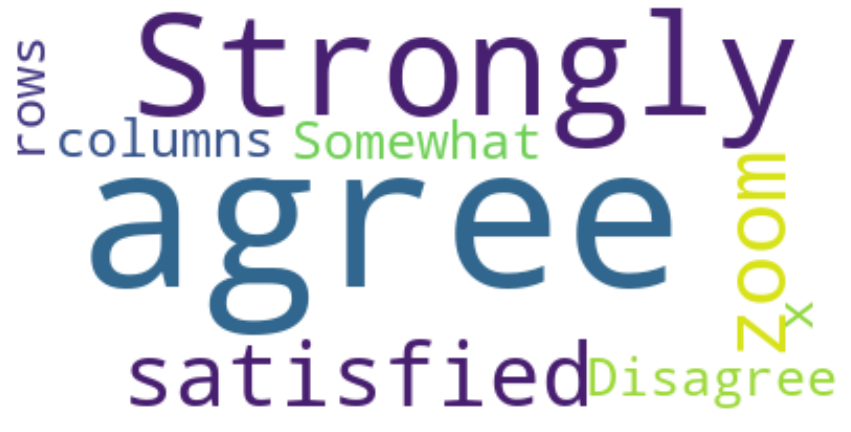



Word cloud to see what is the most common factor for dissatisfaction


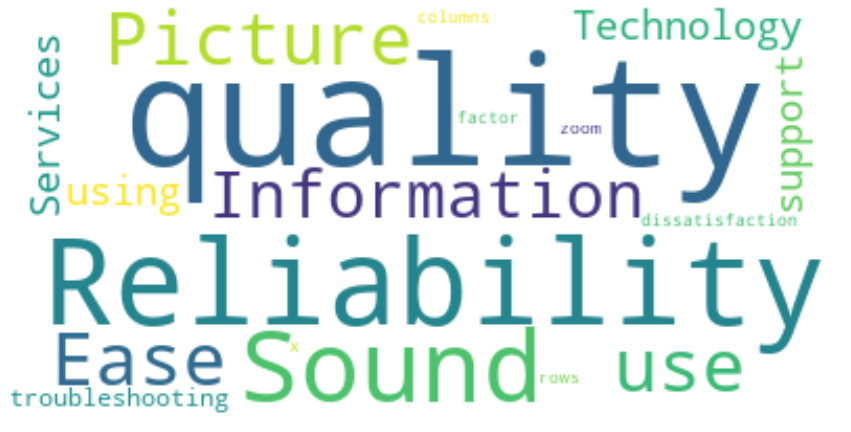



Word cloud to see what is the most common reason for dissatisfaction


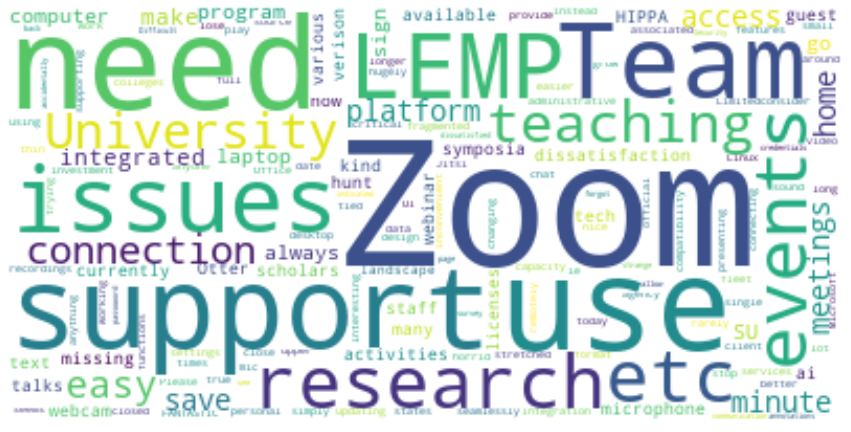

In [ ]:
print("Word cloud to see what is the most common sentiment")
word_cloud(df, col='zoom.satisfied')
print("\n")

print("Word cloud to see what is the most common factor for dissatisfaction")
word_cloud(df, col='zoom.dissatisfaction.factor')
print("\n")

print("Word cloud to see what is the most common reason for dissatisfaction")
word_cloud(df, col='zoom.dissatisfaction.text')

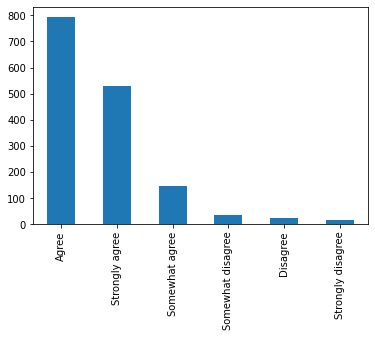

In [ ]:
df['zoom.satisfied'].value_counts().plot(kind='bar')

In [ ]:
# Percentage of users who are not satisfied
disagree_cnt = 0
tot = len(df[df['zoom.satisfied'].isnull()==False]['zoom.satisfied'])
for row in list(df[df['zoom.satisfied'].isnull()==False]['zoom.satisfied']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100*disagree_cnt/tot)

4.786545924967658


The word cloud and the above bar chart show that a large majority of users are happy with the Zoom Video Conferencing feature. Only 4.78% of the users are dissatisfied with the application

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='zoom.dissatisfaction.text',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,zoom,9
1,support,5
2,use,5
3,issues,3
4,teams,3
5,research,3
6,events,3
7,teaching,3
8,needs,3
9,university,3


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='zoom.dissatisfaction.text')).reset_index(drop=True)

,word,tfidf_value
0,use,1.685703
1,zoom,1.523312
2,issues,1.063290
3,teams,1.049998
4,connecting,1.000000
5,make,0.794624
6,easy,0.752555
7,meetings,0.726197
8,save,0.722213
9,connection,0.711905


Analyzing the most common words by checking their frequency and using TF-IDF in the zoom.dissatisfaction.text column, connectivity appears to be a major source of the trouble.

In [ ]:
# Topic Modelling for all the feedbacks
zoom_topic_model = get_bertTopic_model(list(df[df['zoom.dissatisfaction.text'].isnull()==False]['zoom.dissatisfaction.text']),num_topics=5)
get_bertTopic_freq_dist(zoom_topic_model,num_topics=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2022-12-12 01:45:28,116 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:45:30,514 - BERTopic - Reduced dimensionality
2022-12-12 01:45:30,555 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,21,-1_to_zoom_it_not


In [ ]:
get_bertTopic_representatives(zoom_topic_model,num_topics=0)

Topic Modelling is useless because there are too few text inputs (just 21 to be precise)

# Analysis for Teams Video related feedback

Word cloud to see what is the most common sentiment


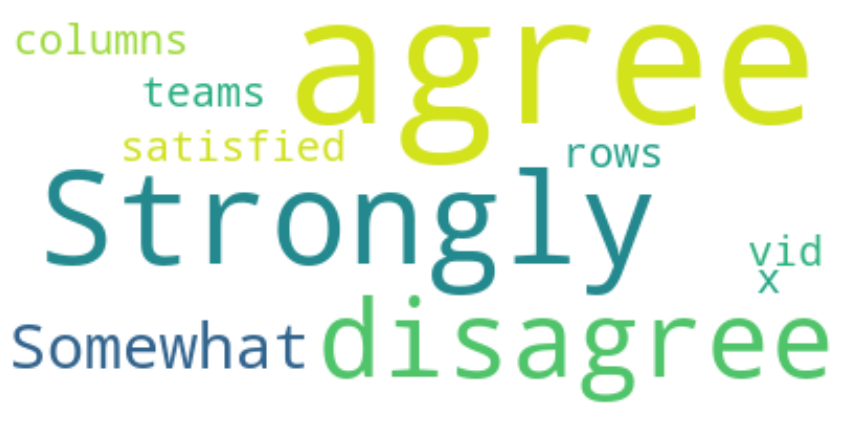



Word cloud to see what is the most common factor for dissatisfaction


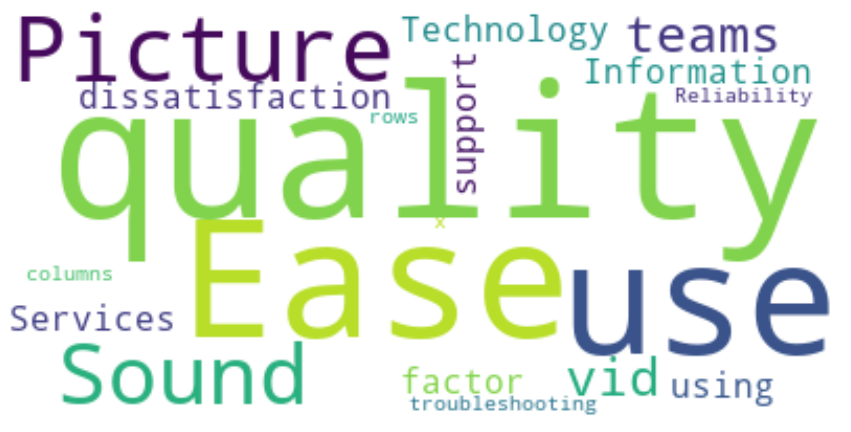



Word cloud to see what is the most common reason for dissatisfaction


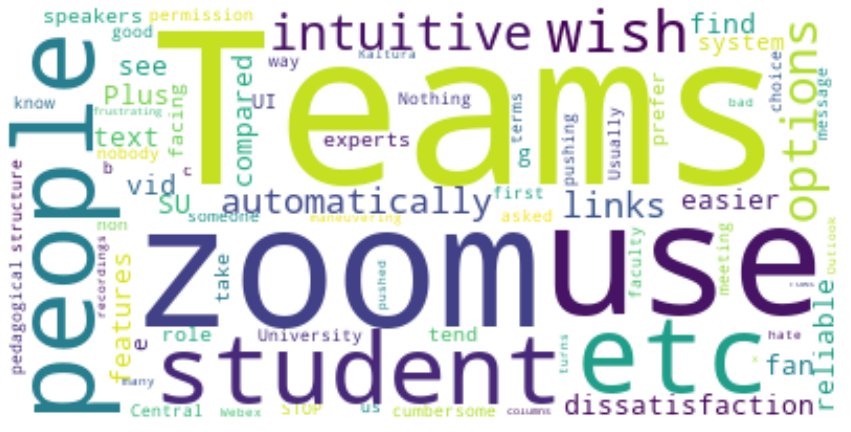

In [ ]:
print("Word cloud to see what is the most common sentiment")
word_cloud(df, col='teams.vid.satisfied')
print("\n")

print("Word cloud to see what is the most common factor for dissatisfaction")
word_cloud(df, col='teams.vid.dissatisfaction.factor')
print("\n")

print("Word cloud to see what is the most common reason for dissatisfaction")
word_cloud(df, col='teams.vid.dissatisfaction.text')

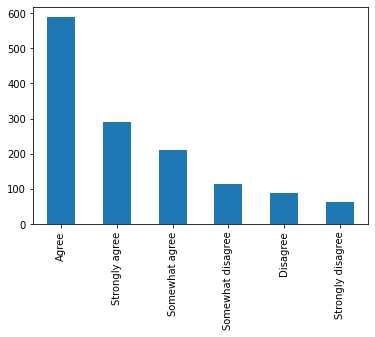

In [ ]:
df['teams.vid.satisfied'].value_counts().plot(kind='bar')

In [ ]:
# Percentage of users who are not satisfied with teams video
disagree_cnt = 0
tot = len(df[df['teams.vid.satisfied'].isnull()==False]['teams.vid.satisfied'])
for row in list(df[df['teams.vid.satisfied'].isnull()==False]['teams.vid.satisfied']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100*disagree_cnt/tot)

19.58610495195861


Picture Quality appears to be a major factor of dissatisfaction among Teams users. Users also find it not very intuitive or reliable. Moreover, Zoom is the preferred product. THis is also evident from the fact that 19.5% users are dissatisfied with Teams whereas only 4.8% were dissatisfied with Zoom.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='teams.vid.dissatisfaction.text',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,zoom,28
1,teams,22
2,meetings,9
3,use,9
4,work,8
5,meeting,6
6,see,6
7,microsoft,5
8,people,4
9,time,4


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='teams.vid.dissatisfaction.text')).reset_index(drop=True)

,word,tfidf_value
0,zoom,6.127218
1,teams,4.353931
2,use,3.036209
3,clunky,2.479434
4,like,2.342871
5,don,2.241559
6,easier,1.916264
7,meetings,1.836572
8,prefer,1.805585
9,meeting,1.659280


Analyzing the most common words by checking their frequency and using TF-IDF in the teams.vid.dissatisfaction.text column, users seem to prefer Zoom and find teams less clunky and easier to use.

In [ ]:
# Topic Modelling for all the feedbacks
teams_topic_model = get_bertTopic_model(list(df[df['teams.vid.dissatisfaction.text'].isnull()==False]['teams.vid.dissatisfaction.text']),num_topics=5)
get_bertTopic_freq_dist(teams_topic_model,num_topics=5)

Batches:   0%|          | 0/3 [00:00<?, ?it/s]

2022-12-12 01:45:39,936 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:45:41,647 - BERTopic - Reduced dimensionality
2022-12-12 01:45:41,667 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,19,-1_teams_is_on_it
1,0,29,0_zoom_it_and_to
2,1,21,1_to_that_is_the


In [ ]:
get_bertTopic_representatives(teams_topic_model,num_topics=2)


== Representative documents in cluster # 0
["It's just less intuitive than zoom.", 'Simply not as good as Zoom', 'I am not that familiar with it and I prefer Zoom']

== Representative documents in cluster # 1
["It doesn't work well for meetings with more than one person. It is sometimes hard to tell when folks are speaking as there is a delay and constantly creates interuptions, etc. ", 'Don’t like that I can’t see everyone at once', "I dont set up meeting's, only attend"]


## Cluster Analysis

    Cluster 0 - Prefer Zoom

Details: Users seem to be more happy with Zoom as a product

    Cluster 1 - Complaints

Details: Issues with the chat interface, screen layouts and mic.

**Topic Modelling of Feedback from reviewers who were STRONGLY DISSATISFIED with Teams Video**

In [ ]:
len(df[(df['teams.vid.dissatisfaction.text'].isnull()==False) & (df['teams.vid.satisfied']=="Strongly disagree")]['teams.vid.dissatisfaction.text'])

17

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
sd_teams_topic_model = get_bertTopic_model(list(df[(df['teams.vid.dissatisfaction.text'].isnull()==False) & (df['teams.vid.satisfied']=="Strongly disagree")]['teams.vid.dissatisfaction.text']),num_topics=5)
get_bertTopic_freq_dist(sd_teams_topic_model,num_topics=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2022-12-12 01:45:45,765 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:45:48,341 - BERTopic - Reduced dimensionality
2022-12-12 01:45:48,350 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,17,-1_to_it_is_the


In [ ]:
get_bertTopic_representatives(sd_teams_topic_model,num_topics=0)

OBSERVATION: Too little data to effectively differentiate

**Topic Modelling of Feedback from reviewers who were DISSATISFIED with Teams Video**

In [ ]:
len(df[(df['teams.vid.dissatisfaction.text'].isnull()==False) & (df['teams.vid.satisfied']=="Disagree")]['teams.vid.dissatisfaction.text'])

21

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
d_teams_topic_model = get_bertTopic_model(list(df[(df['teams.vid.dissatisfaction.text'].isnull()==False) & (df['teams.vid.satisfied']=="Disagree")]['teams.vid.dissatisfaction.text']),num_topics=5)
get_bertTopic_freq_dist(d_teams_topic_model,num_topics=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2022-12-12 01:45:51,377 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:45:53,012 - BERTopic - Reduced dimensionality
2022-12-12 01:45:53,022 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,21,-1_the_zoom_is_it


In [ ]:
get_bertTopic_representatives(d_teams_topic_model,num_topics=0)

OBSERVATION: Too little data to effectively differentiate

**Topic Modelling of Feedback from reviewers who were SOMEWHAT DISSATISFIED with MySlice**

In [ ]:
len(df[(df['teams.vid.dissatisfaction.text'].isnull()==False) & (df['teams.vid.satisfied']=="Somewhat disagree")]['teams.vid.dissatisfaction.text'])

31

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
sod_teams_topic_model = get_bertTopic_model(list(df[(df['teams.vid.dissatisfaction.text'].isnull()==False) & (df['teams.vid.satisfied']=="Somewhat disagree")]['teams.vid.dissatisfaction.text']),num_topics=5)
get_bertTopic_freq_dist(sd_teams_topic_model,num_topics=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2022-12-12 01:45:56,239 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:45:57,895 - BERTopic - Reduced dimensionality
2022-12-12 01:45:57,903 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,17,-1_to_it_is_the


In [ ]:
get_bertTopic_representatives(sod_teams_topic_model,num_topics=0)

OBSERVATION: Too little data to effectively differentiate

# Analysis for Blackboard related feedback

Word cloud to see what is the most common sentiment


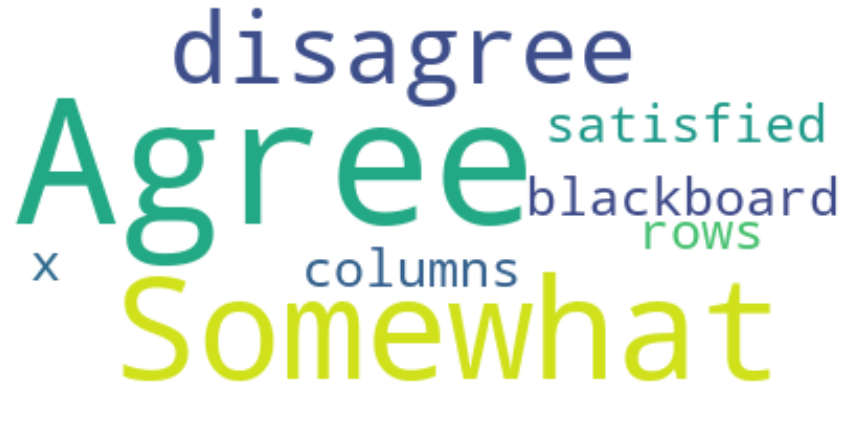



Word cloud to see what is the most common factor for dissatisfaction


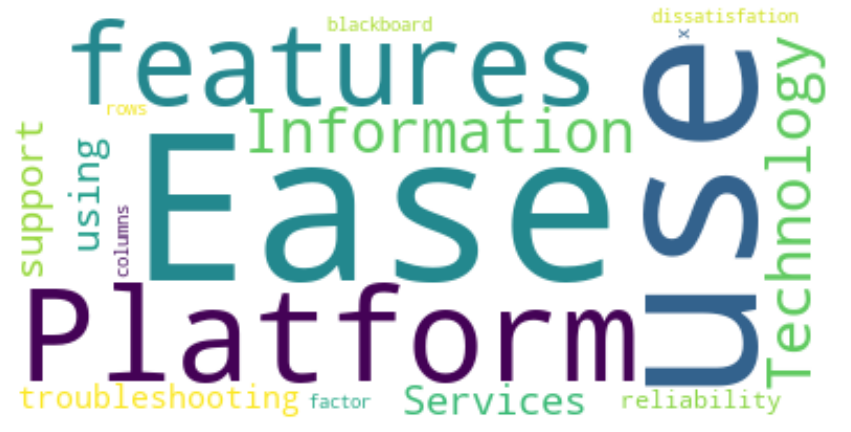



Word cloud to see what is the most common reason for dissatisfaction


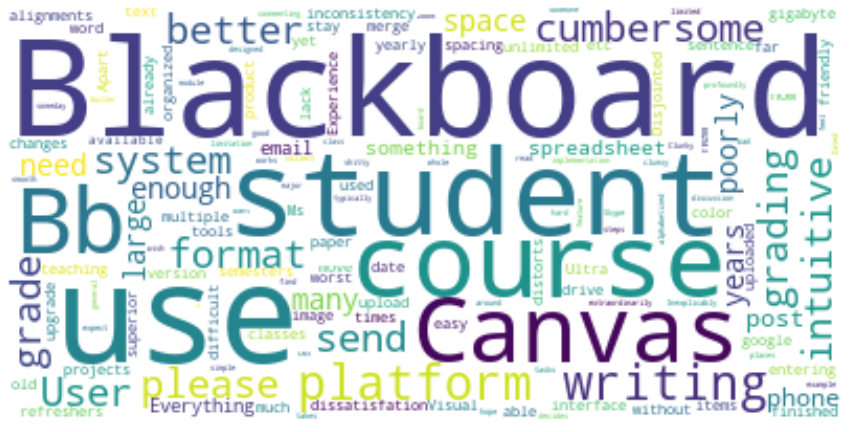

In [ ]:
print("Word cloud to see what is the most common sentiment")
word_cloud(df, col='blackboard.satisfied')
print("\n")

print("Word cloud to see what is the most common factor for dissatisfaction")
word_cloud(df, col='blackboard.dissatisfation.factor')
print("\n")

print("Word cloud to see what is the most common reason for dissatisfaction")
word_cloud(df, col='blackboard.dissatisfation.text')

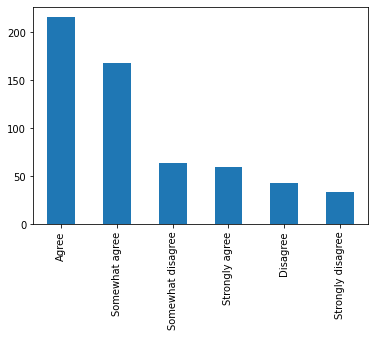

In [ ]:
df['blackboard.satisfied'].value_counts().plot(kind='bar')

In [ ]:
# Percentage of users who are not satisfied with Blackboard
disagree_cnt = 0
tot = len(df[df['blackboard.satisfied'].isnull()==False]['blackboard.satisfied'])
for row in list(df[df['blackboard.satisfied'].isnull()==False]['blackboard.satisfied']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100*disagree_cnt/tot)

24.013722126929675


Users find Blackboard cumbersome and not easy to use. Moreover, 24% of users are dissatisfied with Blackboard. This is further evident from the fact that users are requesting for Canvas instead.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='blackboard.dissatisfation.text',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,use,7
1,blackboard,6
2,student,4
3,course,3
4,writing,3
5,canvas,3
6,bb,3
7,user,2
8,system,2
9,format,2


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='blackboard.dissatisfation.text')).reset_index(drop=True)

,word,tfidf_value
0,canvas,1.754593
1,blackboard,1.470354
2,use,1.090066
3,user,1.079436
4,hard,0.854397
5,course,0.808674
6,interface,0.753255
7,like,0.746996
8,platform,0.711672
9,poorly,0.711672


Analyzing the most common words by checking their frequency and using TF-IDF in the teams.vid.dissatisfaction.text column, users seem to prefer Canvas and find the Blackboard interface harder to use and poorly designed.

In [ ]:
# Topic Modelling for all the feedbacks
black_topic_model = get_bertTopic_model(list(df[df['blackboard.dissatisfation.text'].isnull()==False]['blackboard.dissatisfation.text']),num_topics=5)
get_bertTopic_freq_dist(black_topic_model,num_topics=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2022-12-12 01:46:02,500 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:46:04,610 - BERTopic - Reduced dimensionality
2022-12-12 01:46:04,621 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,17,-1_to_is_it_the


# Analysis for Kaltura related feedback

In [ ]:
for col in df.columns:
  if 'kaltura' in col:
    print(col)


kaltura.satisfied
kaltura.dissatisfation.factor
kaltura.dissatisfation.text


Word cloud to see what is the most common sentiment


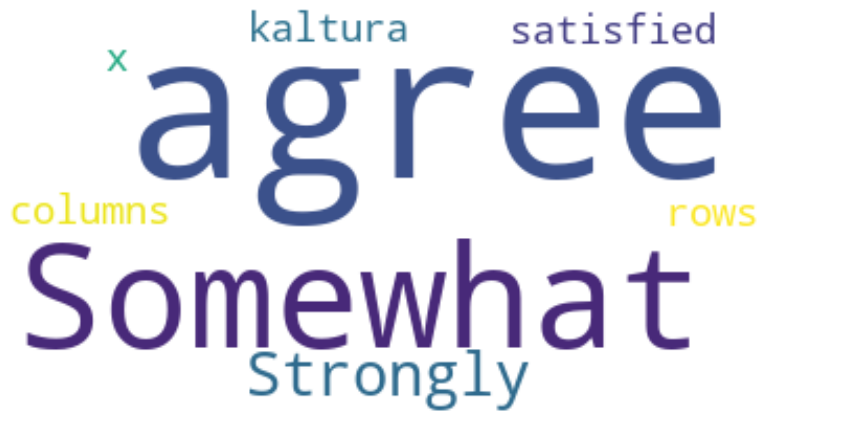



Word cloud to see what is the most common factor for dissatisfaction


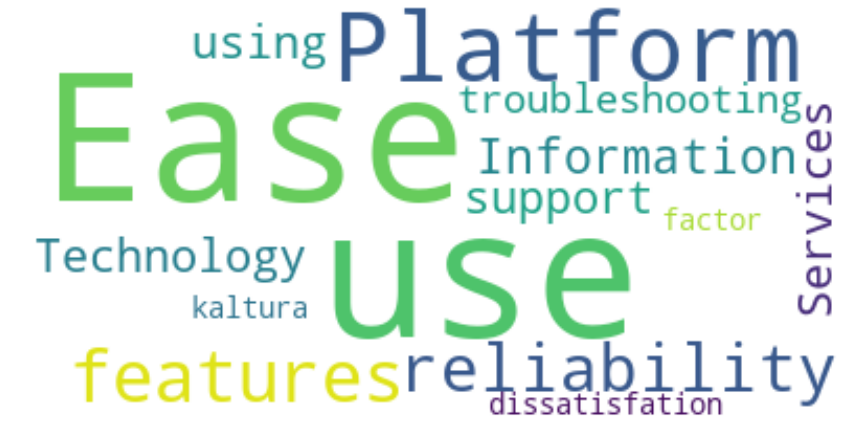



Word cloud to see what is the most common reason for dissatisfaction


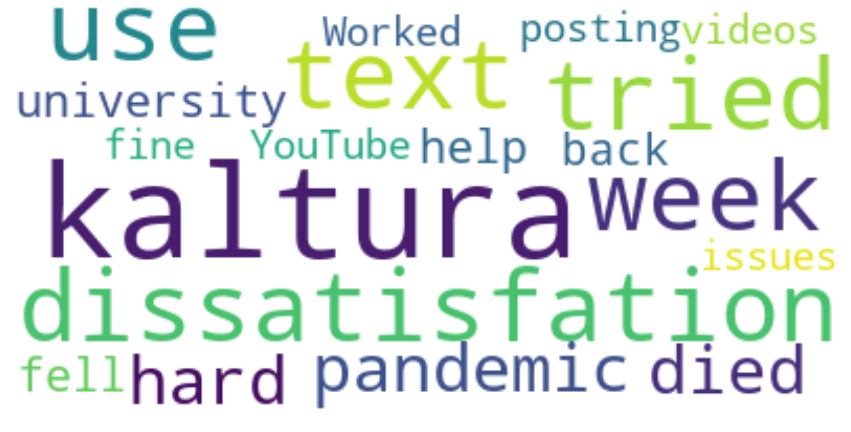

In [ ]:
print("Word cloud to see what is the most common sentiment")
word_cloud(df, col='kaltura.satisfied')
print("\n")

print("Word cloud to see what is the most common factor for dissatisfaction")
word_cloud(df, col='kaltura.dissatisfation.factor')
print("\n")

print("Word cloud to see what is the most common reason for dissatisfaction")
word_cloud(df, col='kaltura.dissatisfation.text')

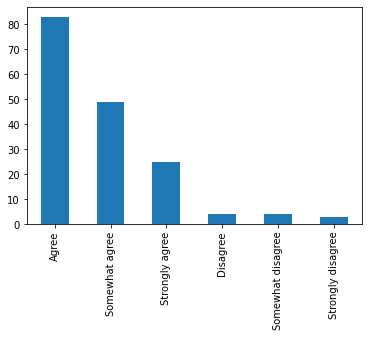

In [ ]:
df['kaltura.satisfied'].value_counts().plot(kind='bar')

In [ ]:
# Percentage of users who are not satisfied with kaltura video
disagree_cnt = 0
tot = len(df[df['kaltura.satisfied'].isnull()==False]['kaltura.satisfied'])
for row in list(df[df['kaltura.satisfied'].isnull()==False]['kaltura.satisfied']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100*disagree_cnt/tot)

6.5476190476190474


Users find Kaltura easy to use and found it useful during the pandemic.
Moreover, only 6.5% of users are dissatisfied with Kaltura.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='kaltura.dissatisfation.text',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,week,1
1,pandemic,1
2,university,1
3,help,1
4,videos,1
5,issues,1
6,fine,1
7,youtube,1
8,tried,1
9,use,1


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='kaltura.dissatisfation.text')).reset_index(drop=True)

,word,tfidf_value
0,died,0.258199
1,fell,0.258199
2,fine,0.258199
3,hard,0.258199
4,help,0.258199
5,issues,0.258199
6,pandemic,0.258199
7,posting,0.258199
8,tried,0.258199
9,university,0.258199


There was only 1 response in the text column so this seems redundant

# Analysis for Teaching Tools related feedback

In [ ]:
for col in df.columns:
  if 'teaching' in col:
    print(col)


teaching.tools.find.information
teaching.tools.help.support
teaching.tools.communication
teaching.tools.feedback


percent 20.238095238095237


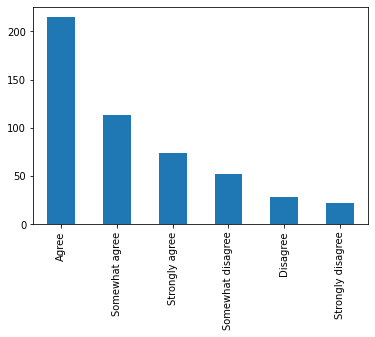

In [ ]:
df['teaching.tools.communication'].value_counts().plot(kind='bar')
# Percentage of users who are not satisfied with teaching tools
disagree_cnt = 0
tot = len(df[df['teaching.tools.communication'].isnull()==False]['teaching.tools.communication'])
for row in list(df[df['teaching.tools.communication'].isnull()==False]['teaching.tools.communication']):
  if 'isagree' in row:
    disagree_cnt+=1
print(f'percent {100*disagree_cnt/tot}')

percent 14.210526315789474


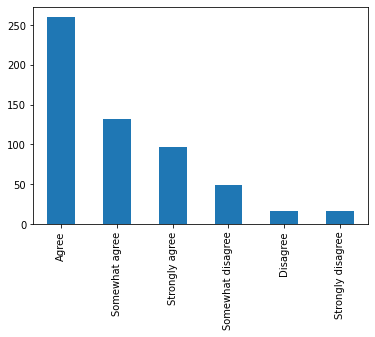

In [ ]:
df['teaching.tools.help.support'].value_counts().plot(kind='bar')
# Percentage of users who are not satisfied with teaching tools
disagree_cnt = 0
tot = len(df[df['teaching.tools.help.support'].isnull()==False]['teaching.tools.help.support'])
for row in list(df[df['teaching.tools.help.support'].isnull()==False]['teaching.tools.help.support']):
  if 'isagree' in row:
    disagree_cnt+=1
print(f'percent {100*disagree_cnt/tot}')

percent 16.920473773265652


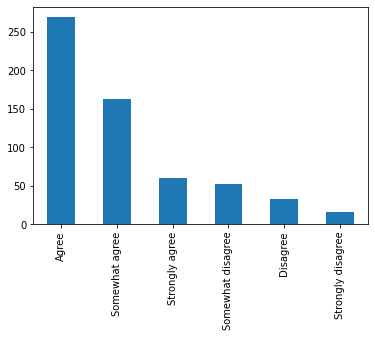

In [ ]:
df['teaching.tools.find.information'].value_counts().plot(kind='bar')
# Percentage of users who are not satisfied with teaching tools
disagree_cnt = 0
tot = len(df[df['teaching.tools.find.information'].isnull()==False]['teaching.tools.find.information'])
for row in list(df[df['teaching.tools.find.information'].isnull()==False]['teaching.tools.find.information']):
  if 'isagree' in row:
    disagree_cnt+=1
print(f'percent {100*disagree_cnt/tot}')

Word cloud for general feedback received


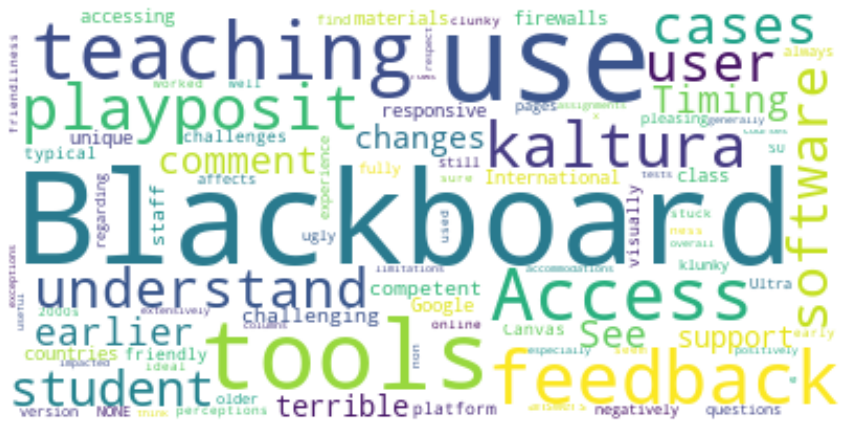

In [ ]:
print('Word cloud for general feedback received')
word_cloud(df, col='teaching.tools.feedback')
print("\n")

It seems like Blackboard is used extensively while giving feedback along with the fact that it is difficult to use. Kaltura and Playposit are also important applications which people feel require improvement.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='teaching.tools.feedback',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,blackboard,87
1,use,39
2,help,26
3,support,24
4,students,23
5,teaching,23
6,time,22
7,helpful,20
8,tools,17
9,su,16


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='teaching.tools.feedback')).reset_index(drop=True)

,word,tfidf_value
0,blackboard,9.610239
1,use,4.952577
2,support,4.321461
3,help,4.068992
4,helpful,3.661491
5,time,3.326245
6,know,3.281715
7,great,3.044692
8,don,3.004614
9,students,2.795859


Analyzing the most common words by checking their frequency and using TF-IDF, Blackoard is an important cause of discomfort among the users due to the poor help and support services. 

In [ ]:
# Topic Modelling for all the feedbacks
tt_topic_model = get_bertTopic_model(list(df[df['teaching.tools.feedback'].isnull()==False]['teaching.tools.feedback']),num_topics=5)
get_bertTopic_freq_dist(tt_topic_model,num_topics=5)

Batches:   0%|          | 0/5 [00:00<?, ?it/s]

2022-12-12 01:46:23,986 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:46:25,784 - BERTopic - Reduced dimensionality
2022-12-12 01:46:25,800 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,26,-1_to_the_and_answers
1,0,57,0_blackboard_the_to_and
2,1,38,1_the_to_of_and
3,2,26,2_and_for_to_the


In [ ]:
get_bertTopic_representatives(tt_topic_model,num_topics=3)


== Representative documents in cluster # 0
["Blackboard is not always easy to use and sometimes glitchy. And some of the functionality it's unclear who to go to for help. For example, posting a textbook purchase online through blackboard was highly problematic and I kept getting bounced between the bookstore and the textbook vendor. Never did get it to work quite right.", "Of the institutions that I've been at, Syracuse's use of Blackboard is fantastic. I have no complaints, and the online documentation has even encouraged me to use more features of the platform that I have in the past. ", 'The only reason I feel somewhat comfortable using blackboard is because of the ITS intensive SITL workshop. In my humble opinion, every SU instructor should be required to take it. It was so awesome!\n\nBlackboard is very capable, but hard to learn. The new Tiny rich text editor requires a training workshop. I am still scratching the surface in regards to automatically grading exercises.\n\nWe are 

## Cluster Analysis

    Cluster 0 - Blackboard

Details: People just don't like Blackboard

    Cluster 1 - Support

Details: HARD TO PUT THEM 

    Cluster 2 - ProfS prefer offline or alternative tools

Details:

**Topic Modelling of Feedback from reviewers who were STRONGLY DISSATISFIED with Teaching Tools**

In [ ]:
len(df[(df['teaching.tools.feedback'].isnull()==False) & ((df['teaching.tools.find.information']=="Strongly disagree") | (df['teaching.tools.help.support']=="Strongly disagree") | (df['teaching.tools.communication']=="Strongly disagree"))]['teaching.tools.feedback'])

15

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
sd_tt_topic_model = get_bertTopic_model(list(df[(df['teaching.tools.feedback'].isnull()==False) & ((df['teaching.tools.find.information']=="Strongly disagree") | (df['teaching.tools.help.support']=="Strongly disagree") | (df['teaching.tools.communication']=="Strongly disagree"))]['teaching.tools.feedback']),num_topics=5)
get_bertTopic_freq_dist(sd_tt_topic_model,num_topics=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2022-12-12 01:46:30,304 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:46:31,919 - BERTopic - Reduced dimensionality
2022-12-12 01:46:31,930 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,15,-1_and_the_to_is


In [ ]:
get_bertTopic_representatives(sd_topic_model,num_topics=0)

OBSERVATION: Not enough data

**Topic Modelling of Feedback from reviewers who were DISSATISFIED with Teaching Tools**

In [ ]:
len(df[(df['teaching.tools.feedback'].isnull()==False) & ((df['teaching.tools.find.information']=="Disagree") | (df['teaching.tools.help.support']=="Disagree") | (df['teaching.tools.communication']=="Disagree"))]['teaching.tools.feedback'])

17

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
d_tt_topic_model = get_bertTopic_model(list(df[(df['teaching.tools.feedback'].isnull()==False) & ((df['teaching.tools.find.information']=="Disagree") | (df['teaching.tools.help.support']=="Disagree") | (df['teaching.tools.communication']=="Disagree"))]['teaching.tools.feedback']),num_topics=5)
get_bertTopic_freq_dist(d_tt_topic_model,num_topics=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2022-12-12 01:46:36,530 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:46:38,682 - BERTopic - Reduced dimensionality
2022-12-12 01:46:38,692 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,17,-1_the_to_is_it


In [ ]:
get_bertTopic_representatives(d_tt_topic_model,num_topics=0)

OBSERVATION: Not enough data

**Topic Modelling of Feedback from reviewers who were SOMEWHAT DISSATISFIED with Teaching Tools**

In [ ]:
len(df[(df['teaching.tools.feedback'].isnull()==False) & ((df['teaching.tools.find.information']=="Somewhat disagree") | (df['teaching.tools.help.support']=="Somewhat disagree") | (df['teaching.tools.communication']=="Somewhat disagree"))]['teaching.tools.feedback'])

30

In [ ]:
# Topic Modelling of STRONGLY DISAGREE feedbacks
sod_tt_topic_model = get_bertTopic_model(list(df[(df['teaching.tools.feedback'].isnull()==False) & ((df['teaching.tools.find.information']=="Somewhat disagree") | (df['teaching.tools.help.support']=="Somewhat disagree") | (df['teaching.tools.communication']=="Somewhat disagree"))]['teaching.tools.feedback']),num_topics=5)
get_bertTopic_freq_dist(sd_tt_topic_model,num_topics=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

2022-12-12 01:46:46,523 - BERTopic - Transformed documents to Embeddings
2022-12-12 01:46:48,180 - BERTopic - Reduced dimensionality
2022-12-12 01:46:48,190 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,15,-1_and_the_to_is


In [ ]:
get_bertTopic_representatives(sod_tt_topic_model,num_topics=0)

OBSERVATION: Data is not enough

# Analysis for Assistive Tool popularity related feedback

In [ ]:
for col in df.columns:
  if 'assistive' in col:
    print(col)


assistive.tech.use
assistive.tech.use.list
assistive.tech.use.text


Word cloud to see what is the most common use


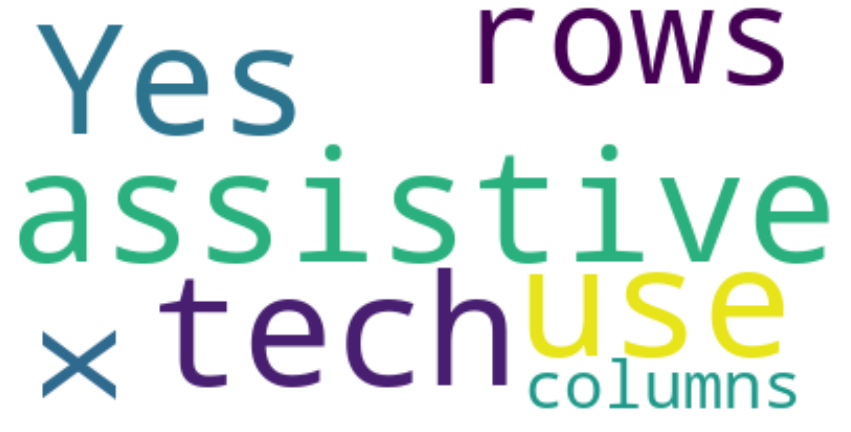



Word cloud to see what is the most common 


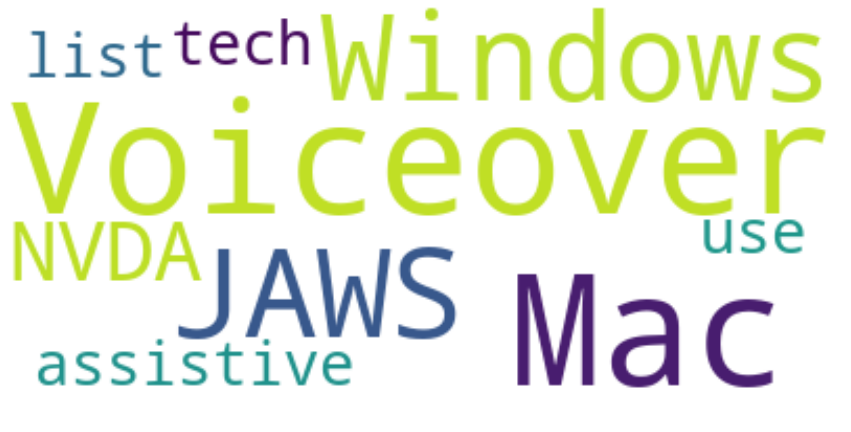



Word cloud to see what is the most common reason for dissatisfaction


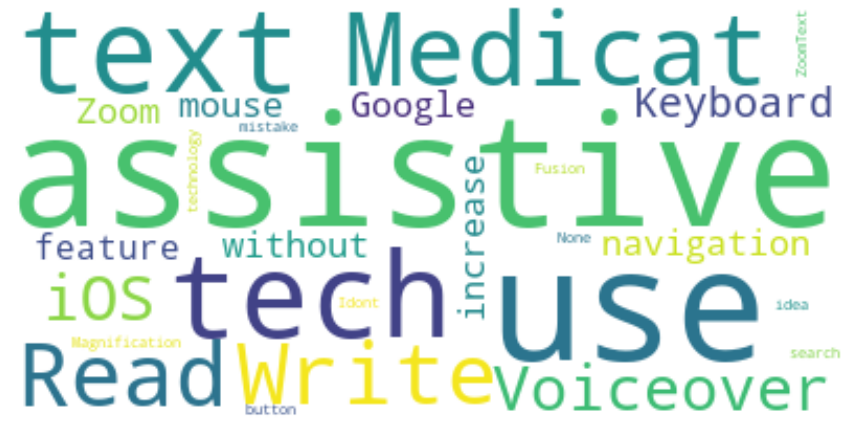

In [ ]:
print("Word cloud to see what is the most common use")
word_cloud(df, col='assistive.tech.use')
print("\n")

print("Word cloud to see what is the most common ")
word_cloud(df, col='assistive.tech.use.list')
print("\n")

print("Word cloud to see what is the most common reason for dissatisfaction")
word_cloud(df, col='assistive.tech.use.text')

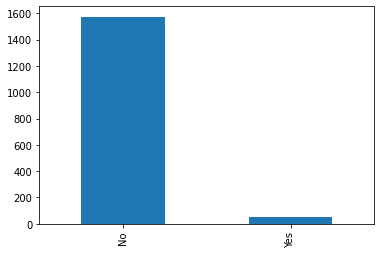

In [ ]:
df['assistive.tech.use'].value_counts().plot(kind='bar')

There is no sentiment column but there is a column that tells us if people actually use assistive tools or not and it seems like they dont from the responses we have received. Out of the assitive tools, seems like Windows for MAC and JAWS for Windows are used the most.

Also the text column doesn't have feedback and the text column barely has any data hence no topic modeling can be done.

# Analysis for Accessibility Feedback

In [ ]:
df[['accessibility.feedback', 'accessibility.policy.knowlege',
    'accessibility.doc.creation.impact', 'accessibility.aware.toolkit',
    'accessibility.professional.development', 'accessibility.feedback.1']]

,accessibility.feedback,accessibility.policy.knowlege,accessibility.doc.creation.impact,accessibility.aware.toolkit,accessibility.professional.development,accessibility.feedback.1
0,NaN,Somewhat disagree,Somewhat disagree,Disagree,Somewhat agree,NaN
1,NaN,Disagree,NaN,Disagree,Agree,NaN
2,NaN,Somewhat agree,Strongly agree,Strongly disagree,Strongly disagree,NaN
3,NaN,Somewhat agree,Somewhat disagree,Agree,Agree,NaN
4,NaN,Somewhat disagree,Strongly disagree,Agree,Strongly agree,NaN
...,...,...,...,...,...,...
1718,NaN,NaN,NaN,NaN,NaN,NaN
1719,NaN,NaN,NaN,NaN,NaN,NaN
1720,NaN,NaN,NaN,NaN,NaN,NaN
1721,NaN,NaN,NaN,NaN,NaN,NaN


Word cloud to see what is the most common feedback


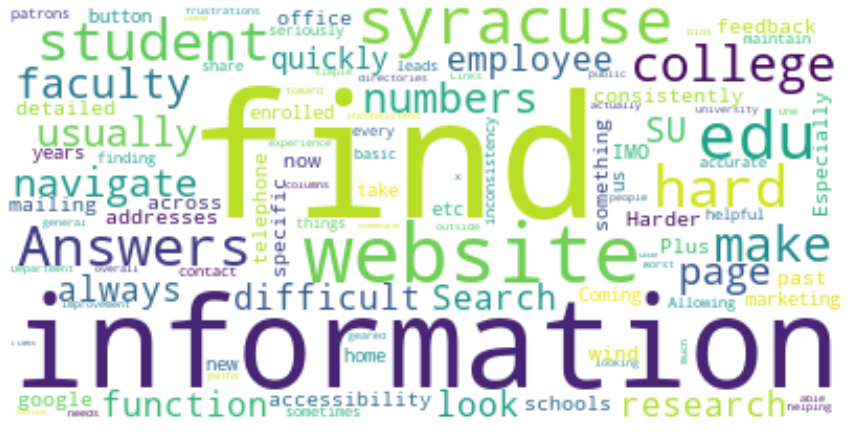



Word cloud to see what is the most common factor for dissatisfaction


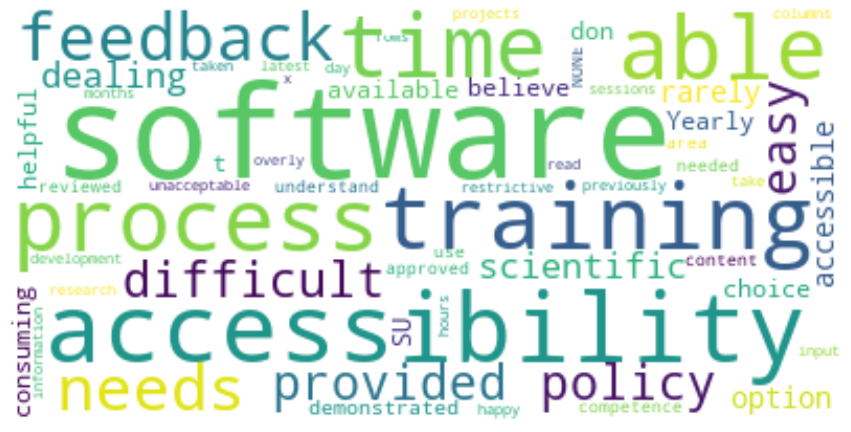

In [ ]:
print("Word cloud to see what is the most common feedback")
word_cloud(df, col='accessibility.feedback')
print("\n")

print("Word cloud to see what is the most common factor for dissatisfaction")
word_cloud(df, col='accessibility.feedback.1')
print("\n")


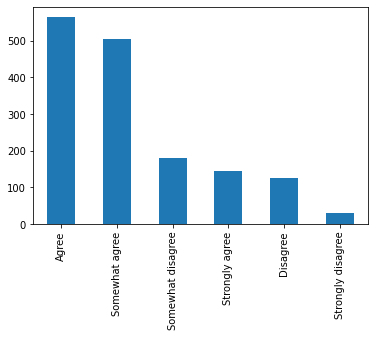

In [ ]:
df['accessibility.policy.knowlege'].value_counts().plot(kind='bar')

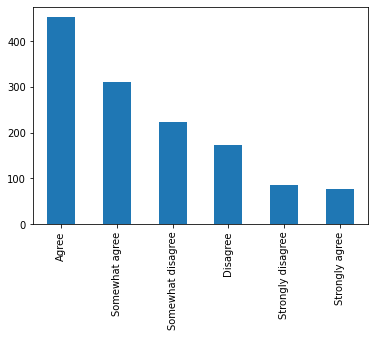

In [ ]:
df['accessibility.doc.creation.impact'].value_counts().plot(kind='bar')

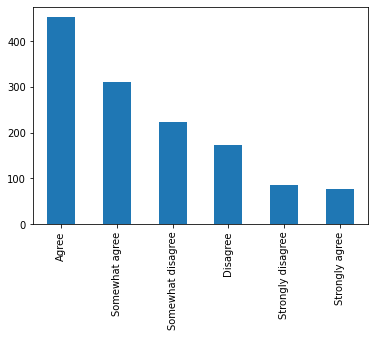

In [ ]:
df['accessibility.doc.creation.impact'].value_counts().plot(kind='bar')

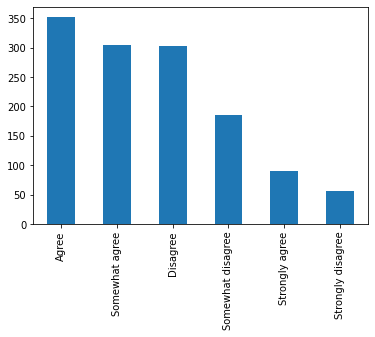

In [ ]:
df['accessibility.aware.toolkit'].value_counts().plot(kind='bar')

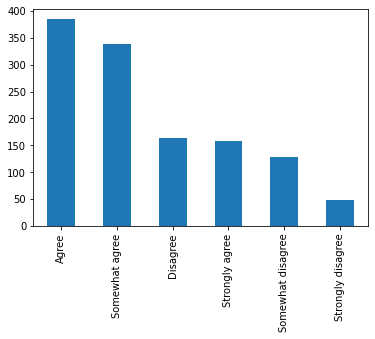

In [ ]:
df[ 'accessibility.professional.development'].value_counts().plot(kind='bar')

In [ ]:
# Percentage of users who are not satisfied

disagree_cnt = 0
tot = len(df[df['accessibility.policy.knowlege'].isnull()==False]['accessibility.policy.knowlege'])
for row in list(df[df['accessibility.policy.knowlege'].isnull()==False]['accessibility.policy.knowlege']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100*disagree_cnt/tot)

disagree_cnt = 0
tot = len(df[df['accessibility.doc.creation.impact'].isnull()==False]['accessibility.doc.creation.impact'])
for row in list(df[df['accessibility.doc.creation.impact'].isnull()==False]['accessibility.doc.creation.impact']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100*disagree_cnt/tot)

disagree_cnt = 0
tot = len(df[df['accessibility.aware.toolkit'].isnull()==False]['accessibility.aware.toolkit'])
for row in list(df[df['accessibility.aware.toolkit'].isnull()==False]['accessibility.aware.toolkit']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100*disagree_cnt/tot)

disagree_cnt = 0
tot = len(df[df['accessibility.professional.development'].isnull()==False]['accessibility.professional.development'])
for row in list(df[df['accessibility.professional.development'].isnull()==False]['accessibility.professional.development']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100*disagree_cnt/tot)

21.677419354838708
36.38426626323752
42.194744976816075
27.905073649754502


Users are having a hard time finding information, we can also see training and software are pain points.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='accessibility.feedback',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,find,131
1,information,125
2,website,103
3,search,77
4,difficult,54
5,page,48
6,websites,43
7,use,39
8,need,38
9,pages,37


In [ ]:
pd.DataFrame(get_freq_distribution(df,col='accessibility.feedback.1',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,accessibility,94
1,accessible,73
2,time,39
3,training,35
4,need,29
5,documents,29
6,faculty,28
7,support,24
8,staff,24
9,university,24


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='accessibility.feedback')).reset_index(drop=True)

,word,tfidf_value
0,information,16.091865
1,website,15.339890
2,search,13.001586
3,difficult,10.527423
4,page,8.677114
5,use,8.207925
6,edu,7.854842
7,hard,7.794457
8,navigate,7.463515
9,websites,7.158308


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='accessibility.feedback.1')).reset_index(drop=True)

,word,tfidf_value
0,accessibility,8.329780
1,accessible,6.941826
2,training,6.891877
3,time,4.694422
4,faculty,4.027845
5,make,3.856592
6,need,3.674859
7,helpful,3.662294
8,staff,3.632627
9,documents,3.532509


Analyzing the most common words by checking their frequency and using TF-IDF in the teams.vid.dissatisfaction.text column, users seem to prefer Canvas and find the Blackboard interface harder to use and poorly designed.

In [ ]:
# Topic Modelling for all the feedbacks
black_topic_model = get_bertTopic_model(list(df[df['accessibility.feedback'].isnull()==False]['accessibility.feedback']),num_topics=5)
get_bertTopic_freq_dist(black_topic_model,num_topics=5)

Batches:   0%|          | 0/11 [00:00<?, ?it/s]

2022-12-12 02:03:52,311 - BERTopic - Transformed documents to Embeddings
2022-12-12 02:03:54,994 - BERTopic - Reduced dimensionality
2022-12-12 02:03:55,016 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,13,-1_none_our_how_on
1,0,292,0_the_to_is_it
2,1,21,1_syracuse_edu_the_to


In [ ]:
get_bertTopic_representatives(black_topic_model,num_topics=2)


== Representative documents in cluster # 0
["some of the general information feels like I'm drilling deeply to find to assist visitors, staff or etc...", 'the syr.edu search NEVER provides accurate information for what I am looking for and always brings up old info. or news articles.', "There are too many dead links.  There are too many pages with repeated information, but much of that information is out of date especially as related to campus resources and policies.  You want a user to be able to find current information within three clicks.  They can, but sometimes the webpage is incorrect. In doing website searches on the SU page, rather than get to the page I need, I get to a SU News story about the office or people I need.  That story does not contact a weblink to then get me to the page I want. Instead, I am culling through page after page of SU News stories that are not helpful.  I also end up with professor's resumes or syllabi.  It is not helpful.  I know that some of that is

In [ ]:
# Topic Modelling for all the feedbacks
topic_model = get_bertTopic_model(list(df[df['accessibility.feedback.1'].isnull()==False]['accessibility.feedback.1']),num_topics=5)
get_bertTopic_freq_dist(topic_model,num_topics=5)

Batches:   0%|          | 0/5 [00:00<?, ?it/s]

2022-12-12 02:20:11,487 - BERTopic - Transformed documents to Embeddings
2022-12-12 02:20:15,361 - BERTopic - Reduced dimensionality
2022-12-12 02:20:15,379 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,0,142,0_to_the_and_is
1,1,12,1_none_no_too_existed


In [ ]:
get_bertTopic_representatives(topic_model,num_topics=2)


== Representative documents in cluster # 0
['I have participated in several accessibility trainings offered so far.', 'i took training a while back, but it is easy not to convert existing docs and just keep using them. If it could be made easier or if there is now a checklist/cheatsheet on creating new docs and converting old docs, would be useful', 'I took this training a few years ago. It was effective. I would want to take it again if there are substantial updates and changes.']

== Representative documents in cluster # 1
['Not clear, too much to wade through', '  ', 'I had no idea this existed. ']


# Analysis for IT Challenges related feedback

In [ ]:
for col in df.columns:
  if 'it.challenge' in col:
    print(col)

it.challenges.text.1
it.challenges.text.2
it.challenges.text.3


Word cloud to see what is the most common sentiment


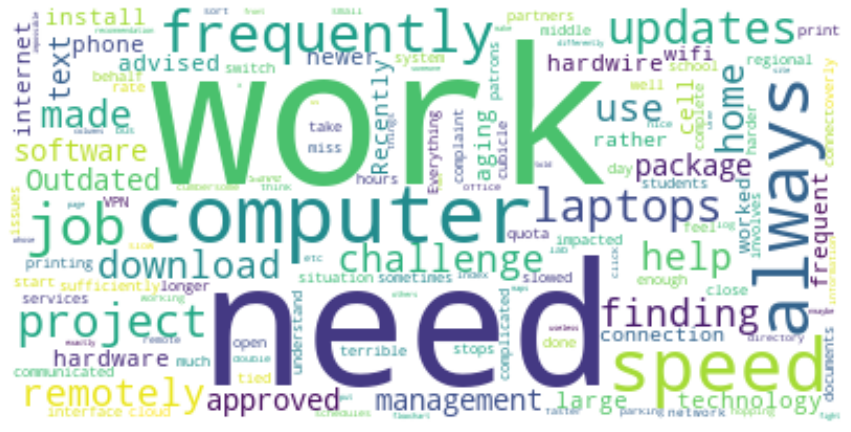



Word cloud to see what is the most common factor for dissatisfaction


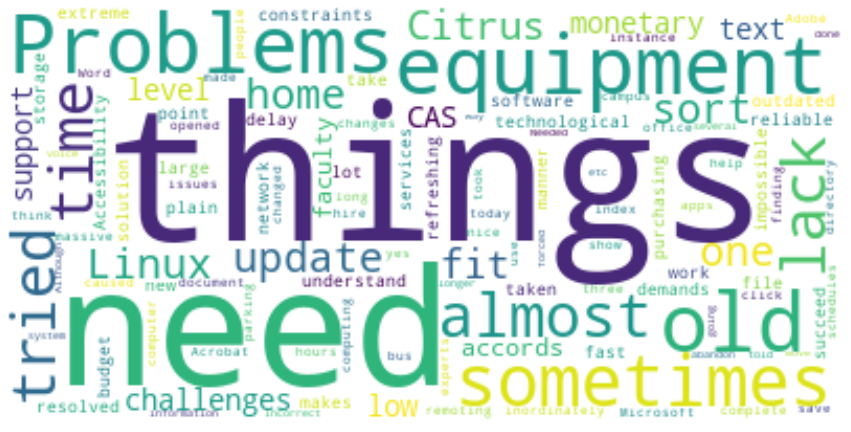



Word cloud to see what is the most common reason for dissatisfaction


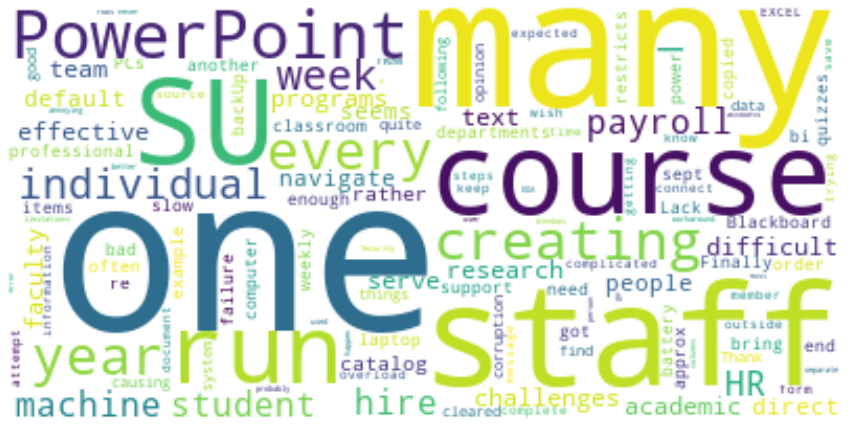

In [ ]:
print("Word cloud to see what is the most common sentiment")
word_cloud(df, col='it.challenges.text.1')
print("\n")

print("Word cloud to see what is the most common factor for dissatisfaction")
word_cloud(df, col='it.challenges.text.2')
print("\n")

print("Word cloud to see what is the most common reason for dissatisfaction")
word_cloud(df, col='it.challenges.text.3')

The main IT challenges faced by users seem to be wrt computer, speed, working from home, laptop, Citrix, Linux, payroll, Powerpoint, overall updates and overall trying to resolve the issues they face.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='it.challenges.text.1',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,time,86
1,work,85
2,use,80
3,computer,71
4,support,71
5,need,64
6,students,62
7,access,61
8,issues,57
9,staff,53


In [ ]:
pd.DataFrame(get_freq_distribution(df,col='it.challenges.text.2',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,use,53
1,time,40
2,work,37
3,support,34
4,software,34
5,students,34
6,university,32
7,su,29
8,access,28
9,campus,25


In [ ]:
pd.DataFrame(get_freq_distribution(df,col='it.challenges.text.3',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,time,19
1,work,18
2,need,18
3,software,17
4,faculty,16
5,students,16
6,technology,15
7,many,15
8,support,14
9,campus,14


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='it.challenges.text.1')).reset_index(drop=True)

,word,tfidf_value
0,time,12.447717
1,computer,12.335829
2,use,11.917477
3,work,11.733822
4,support,11.424550
5,issues,10.613137
6,myslice,10.212018
7,need,9.975667
8,access,9.944368
9,blackboard,9.809474


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='it.challenges.text.2')).reset_index(drop=True)

,word,tfidf_value
0,use,7.132965
1,work,6.114107
2,time,6.053104
3,blackboard,6.043671
4,support,5.926422
5,myslice,5.536724
6,students,5.446446
7,software,5.265740
8,technology,5.128477
9,campus,5.029410


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='it.challenges.text.3')).reset_index(drop=True)

,word,tfidf_value
0,students,3.249079
1,software,3.213532
2,support,3.121490
3,work,3.010398
4,lack,2.888703
5,time,2.807125
6,access,2.796756
7,information,2.656330
8,faculty,2.606559
9,computer,2.549799


Software, Blackboard, mySlice seem to be the reason for reaching out to IT services.

In [ ]:
# Topic Modelling for all the feedbacks
black_topic_model = get_bertTopic_model(list(df[df['it.challenges.text.1'].isnull()==False]['it.challenges.text.1']),num_topics=5)
get_bertTopic_freq_dist(black_topic_model,num_topics=5)
get_bertTopic_representatives(black_topic_model,num_topics=5)

Batches:   0%|          | 0/20 [00:00<?, ?it/s]

2022-12-12 02:21:16,349 - BERTopic - Transformed documents to Embeddings
2022-12-12 02:21:19,566 - BERTopic - Reduced dimensionality
2022-12-12 02:21:19,610 - BERTopic - Clustered reduced embeddings



== Representative documents in cluster # 0
['IT groups are under resourced and under staffed to provide both incremental reliable improvements to existing enterprise systems and also refresh/upgrade to new solutions.  And IT pay is too low to hire new/replacement and maintain existing experienced enterprise IT staff.  This results in only being able to hire bare minimum skill sets.  This blocks transformational change.', 'We desperately need more central support for webpages and functionality. We are told to use third-party vendors for functionality that should be supported (for example, conference tools; registration, abstracts, etc.). Are we an R1 university or what???', 'Unresponsiveness and incompetence of the ITS support staff. // Hire additional staff members.']

== Representative documents in cluster # 1
["I have an employee whose Dell laptop has broken multiple times in the last year. It has had multiple motherboard replacements to try and solve the problems. Despite the numer

## Cluster Analysis

    Cluster 0 - Investing in support

Details: Users feel if the support staff was paid better the support might be better and that more employees need to be brought on to support the IT challenges faced.

    Cluster 1 - Hardware

Details: It is harder to update hardware devices

    Cluster 2 - Blackboard 

Details: Users are again unhappy with Blackboard

    Cluster 3 - Answers.com

Details: Users cant find solutions to their questions on answers.com as they find it overwhelming and time consuming or they have to dig too deep.

    Cluster 4 -  Accessibility Documents

Details: Users are requesting training and documentation regarding incorporating accessibility that they can incorporate in their documents.


In [ ]:
# Topic Modelling for all the feedbacks
black_topic_model = get_bertTopic_model(list(df[df['it.challenges.text.2'].isnull()==False]['it.challenges.text.2']),num_topics=5)
get_bertTopic_freq_dist(black_topic_model,num_topics=5)

Batches:   0%|          | 0/10 [00:00<?, ?it/s]

2022-12-12 02:21:49,808 - BERTopic - Transformed documents to Embeddings
2022-12-12 02:21:51,844 - BERTopic - Reduced dimensionality
2022-12-12 02:21:51,866 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,0,293,0_to_the_and_of
1,1,21,1_blackboard_to_and_the


In [ ]:
# Topic Modelling for all the feedbacks
black_topic_model = get_bertTopic_model(list(df[df['it.challenges.text.3'].isnull()==False]['it.challenges.text.3']),num_topics=5)
get_bertTopic_freq_dist(black_topic_model,num_topics=5)

Batches:   0%|          | 0/5 [00:00<?, ?it/s]

2022-12-12 02:22:07,777 - BERTopic - Transformed documents to Embeddings
2022-12-12 02:22:09,576 - BERTopic - Reduced dimensionality
2022-12-12 02:22:09,593 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,-1,44,-1_to_and_the_my
1,0,93,0_to_the_and_it
2,1,15,1_in_blackboard_is_to


# Analysis for Security related feedback

In [ ]:
for col in df.columns:
  if 'security' in col:
    print(col)

balance.security.usability
security.min.impact.on.work
security.effective.communication
security.know.who.to.talk.to
security.yearly.training
security.feedback


65.29947916666666


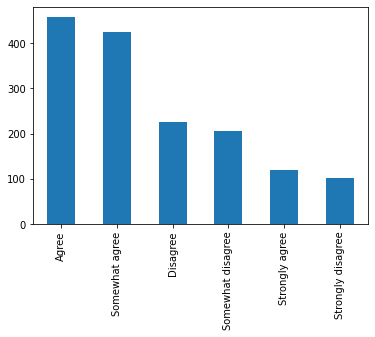

In [ ]:
df['security.yearly.training'].value_counts().plot(kind='bar')
# Percentage of users 
disagree_cnt = 0
tot = len(df[df['security.yearly.training'].isnull()==False]['security.yearly.training'])
for row in list(df[df['security.yearly.training'].isnull()==False]['security.yearly.training']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100 - 100*disagree_cnt/tot)

85.34322820037106


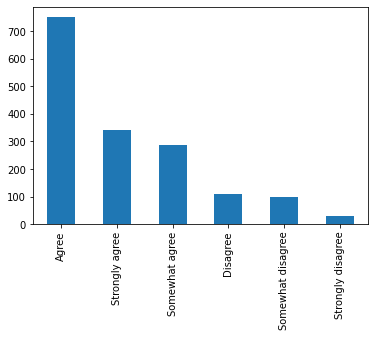

In [ ]:
df['security.know.who.to.talk.to'].value_counts().plot(kind='bar')
# Percentage of users 
disagree_cnt = 0
tot = len(df[df['security.know.who.to.talk.to'].isnull()==False]['security.know.who.to.talk.to'])
for row in list(df[df['security.know.who.to.talk.to'].isnull()==False]['security.know.who.to.talk.to']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100 - 100*disagree_cnt/tot)

86.19986403806934


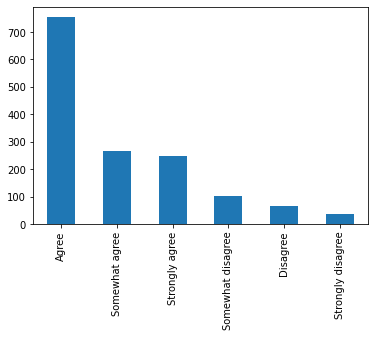

In [ ]:
df['security.effective.communication'].value_counts().plot(kind='bar')
# Percentage of users 
disagree_cnt = 0
tot = len(df[df['security.effective.communication'].isnull()==False]['security.effective.communication'])
for row in list(df[df['security.effective.communication'].isnull()==False]['security.effective.communication']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100 - 100*disagree_cnt/tot)

86.9621066152858


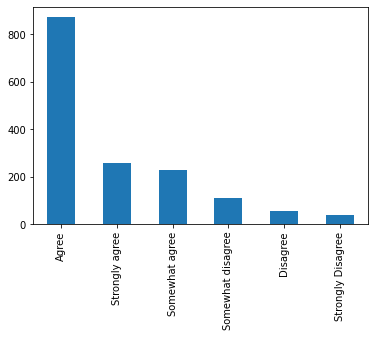

In [ ]:
df['balance.security.usability'].value_counts().plot(kind='bar')
# Percentage of users 
disagree_cnt = 0
tot = len(df[df['balance.security.usability'].isnull()==False]['balance.security.usability'])
for row in list(df[df['balance.security.usability'].isnull()==False]['balance.security.usability']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100 - 100*disagree_cnt/tot)

77.6536312849162


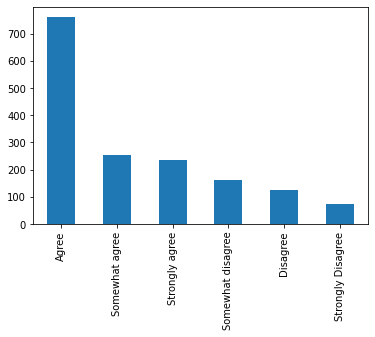

In [ ]:
df['security.min.impact.on.work'].value_counts().plot(kind='bar')
# Percentage of users 
disagree_cnt = 0
tot = len(df[df['security.min.impact.on.work'].isnull()==False]['security.min.impact.on.work'])
for row in list(df[df['security.min.impact.on.work'].isnull()==False]['security.min.impact.on.work']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100 - 100*disagree_cnt/tot)

Word cloud to see what is the most feedback


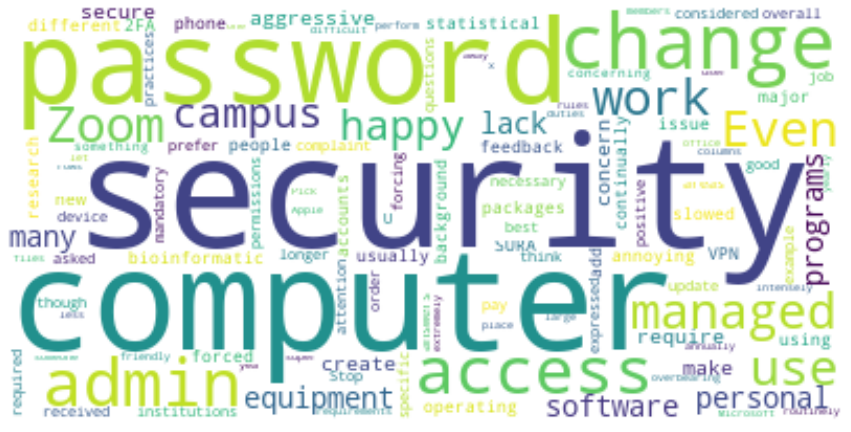

In [ ]:
print("Word cloud to see what is the most feedback")
word_cloud(df, col='security.feedback')
print("\n")


The word cloud shows that computer access and password are issues and people are happy with the security.

In [ ]:
pd.DataFrame(get_freq_distribution(df,col='security.feedback',mostCommon=10),columns=['Word','Count'])

,Word,Count
0,security,149
1,work,68
2,use,66
3,training,62
4,time,49
5,need,48
6,campus,42
7,access,40
8,computer,38
9,password,37


In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='security.feedback')).reset_index(drop=True)

,word,tfidf_value
0,security,14.448475
1,training,9.724687
2,time,8.949877
3,use,8.259457
4,work,8.087964
5,need,6.650502
6,issues,6.554919
7,like,6.470296
8,campus,6.221634
9,password,5.983849


Analyzing the most common words by checking their frequency and using TF-IDF, training, access, password appears to be a major source of the trouble.

In [ ]:
# Topic Modelling for all the feedbacks
topic_model = get_bertTopic_model(list(df[df['security.feedback'].isnull()==False]['security.feedback']),num_topics=5)
get_bertTopic_freq_dist(topic_model,num_topics=5)

Batches:   0%|          | 0/11 [00:00<?, ?it/s]

2022-12-13 06:30:43,823 - BERTopic - Transformed documents to Embeddings
2022-12-13 06:30:47,837 - BERTopic - Reduced dimensionality
2022-12-13 06:30:47,871 - BERTopic - Clustered reduced embeddings


,Topic,Count,Name
0,0,301,0_to_the_and_it
1,1,21,1_no_none_not_know


In [ ]:
get_bertTopic_representatives(topic_model,num_topics=2)


== Representative documents in cluster # 0
["It's nice to hear about new types of cyberthreats; I'm not sure that needs to be shared in an actual training, but that's just my opinion. I'll do what I'm asked to do with it.", "We don't have an easily accessible vpn client; RDS is an extraordinarily cumbersome workaround for individuals who need to be able to make secure connections between the SU network and external networks (i.e. accessing high performance computers in national labs, other universities, federal government). This kind of blows my mind.\n", 'The only thing that bugs me about security is that I went through the trouble of setting up the Microsoft Authenticator on my iPhone to help with 2FA login requirements. The trouble is that the way ITS has 2FA configured (requiring the user to enter a 2-digit code into the app rather than just tapping a confirm/deny button) means that it does not also work with the Microsoft Authenticator app for Apple Watch. When you try to approve

From the cluster above, seems like training with respect to security is necessary and logging in using Authenticator App and RDS is hard

# Analysis for Playposit related feedback

In [ ]:
for col in df.columns:
  if 'playposit' in col:
    print(col)



playposit.satisfied
playposit.dissatisfation.factor
playposit.dissatisfation.text


88.0952380952381


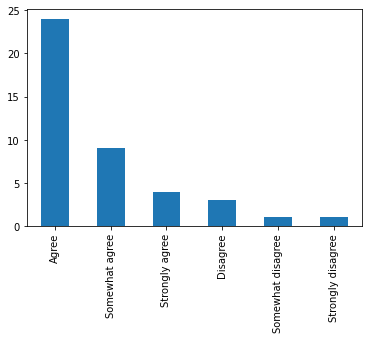

In [ ]:
df['playposit.satisfied'].value_counts().plot(kind='bar')
# Percentage of users 
disagree_cnt = 0
tot = len(df[df['playposit.satisfied'].isnull()==False]['playposit.satisfied'])
for row in list(df[df['playposit.satisfied'].isnull()==False]['playposit.satisfied']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100 - 100*disagree_cnt/tot)

Word cloud to see what is the most feedback


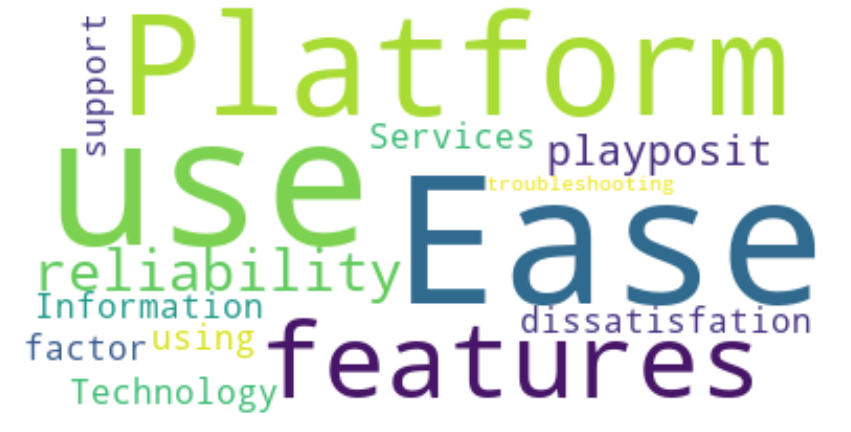



Word cloud to see what is the most feedback


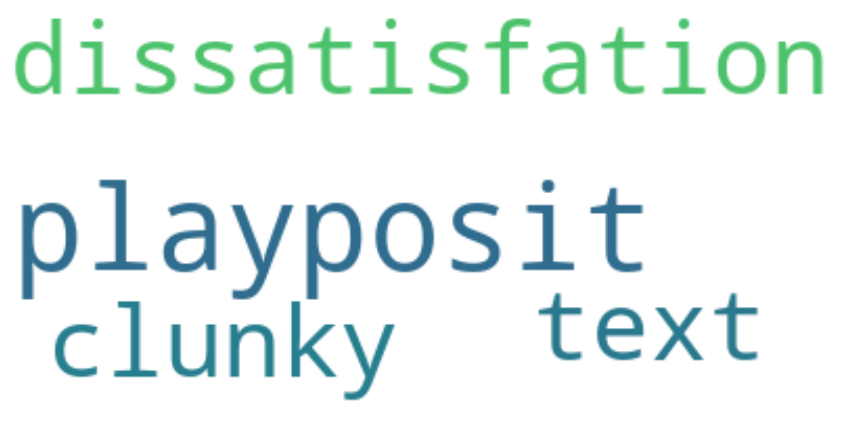

In [ ]:
print("Word cloud to see what is the most feedback")
word_cloud(df, col='playposit.dissatisfation.factor')
print("\n")

print("Word cloud to see what is the most feedback")
word_cloud(df, col='playposit.dissatisfation.text')
print("\n")


The word cloud shows that computer access and password are issues and people are happy with the security.

In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='playposit.dissatisfation.text')).reset_index(drop=True)

,word,tfidf_value
0,clunky,1.0


# Analysis for Google Suite related feedback

In [ ]:
for col in df.columns:
  if 'google' in col:
    print(col)


google.suite.satisfied
google.suite.dissatisfation.factor
google.suite.dissatisfation.text


96.15384615384616


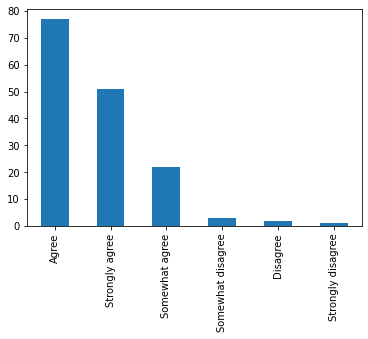

In [ ]:
df['google.suite.satisfied'].value_counts().plot(kind='bar')
# Percentage of users 
disagree_cnt = 0
tot = len(df[df['google.suite.satisfied'].isnull()==False]['google.suite.satisfied'])
for row in list(df[df['google.suite.satisfied'].isnull()==False]['google.suite.satisfied']):
  if 'isagree' in row:
    disagree_cnt+=1
print(100 - 100*disagree_cnt/tot)

Word cloud to see what is the most feedback


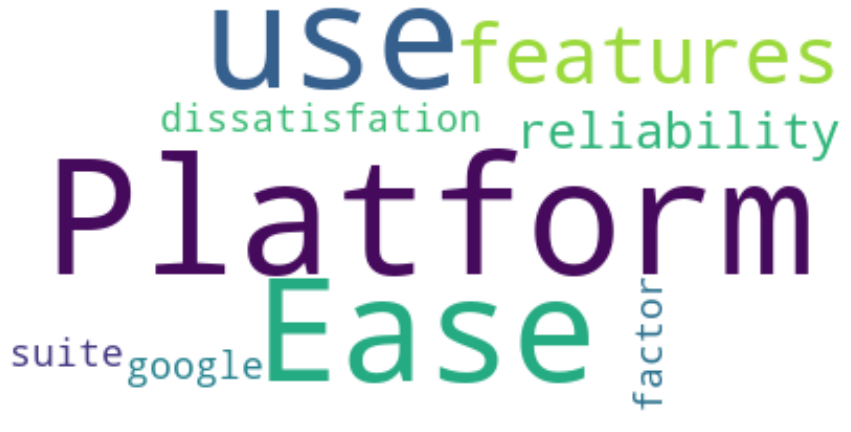



Word cloud to see what is the most feedback


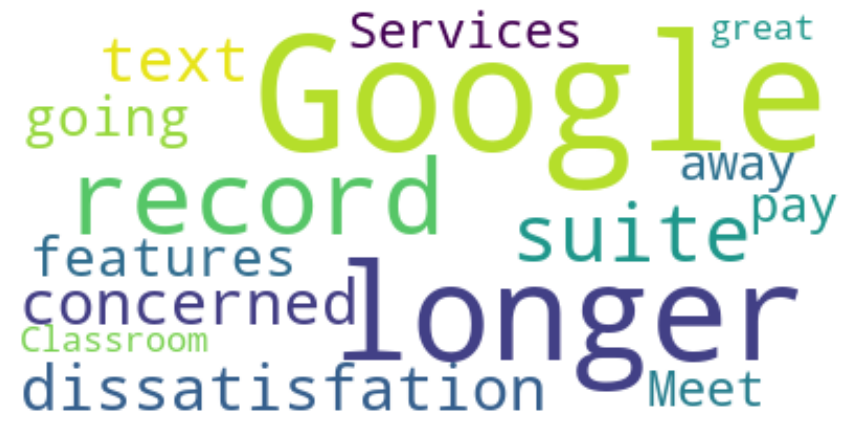

In [ ]:
print("Word cloud to see what is the most feedback")
word_cloud(df, col='google.suite.dissatisfation.factor')
print("\n")

print("Word cloud to see what is the most feedback")
word_cloud(df, col='google.suite.dissatisfation.text')
print("\n")


The word cloud shows that computer access and password are issues and people are happy with the security.

In [ ]:
pd.DataFrame(tfidf_vectorizer(10,df,col='google.suite.dissatisfation.text')).reset_index(drop=True)

,word,tfidf_value
0,longer,0.589608
1,record,0.589608
2,google,0.488698
3,away,0.392044
4,concerned,0.392044
5,features,0.392044
6,going,0.392044
7,pay,0.392044
8,services,0.392044
9,classroom,0.294804


# Reference

- https://medium.com/@piocalderon/vader-sentiment-analysis-explained-f1c4f9101cd9#:~:text=VADER%20sentiment%20analysis%20combines%20a,movie%20reviews%20and%20opinion%20articles.


